In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import math
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from scipy import stats

In [2]:
raw_data = pd.read_csv('NashvilleHousingCleaned.csv')
raw_data.dropna(how='all',inplace=True)
raw_data

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,StreetAddress,City,Age_of_House,State
0,2045.0,007 00 0 125.00,SINGLE FAMILY,2013-04-09,"R240,000.00",20130412-0036474,0.0,2.3,50000.0,168200.0,235700.0,1986.0,3.0,3.0,0.0,1808 FOX CHASE DR,GOODLETTSVILLE,27.0,TN
1,16918.0,007 00 0 130.00,SINGLE FAMILY,2014-06-10,"R366,000.00",20140619-0053768,0.0,3.5,50000.0,264100.0,319000.0,1998.0,3.0,3.0,2.0,1832 FOX CHASE DR,GOODLETTSVILLE,16.0,TN
2,54582.0,007 00 0 138.00,SINGLE FAMILY,2016-09-26,"R435,000.00",20160927-0101718,0.0,2.9,50000.0,216200.0,298000.0,1987.0,4.0,3.0,0.0,1864 FOX CHASE DR,GOODLETTSVILLE,29.0,TN
3,43070.0,007 00 0 143.00,SINGLE FAMILY,2016-01-29,"R255,000.00",20160129-0008913,0.0,2.6,50000.0,147300.0,197300.0,1985.0,3.0,3.0,0.0,1853 FOX CHASE DR,GOODLETTSVILLE,31.0,TN
4,22714.0,007 00 0 149.00,SINGLE FAMILY,2014-10-10,"R278,000.00",20141015-0095255,0.0,2.0,50000.0,152300.0,202300.0,1984.0,4.0,3.0,0.0,1829 FOX CHASE DR,GOODLETTSVILLE,30.0,TN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56368,30469.0,188 10 0A 101.00,SINGLE FAMILY,2015-05-27,"R157,500.00",20150608-0053286,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1435 WINDING CREEK DR,NOLENSVILLE,NaN,NaN
56369,27707.0,188 10 0A 107.00,SINGLE FAMILY,2015-03-02,"R145,000.00",20150304-0019013,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1423 WINDING CREEK DR,NOLENSVILLE,NaN,NaN
56370,52709.0,188 10 0A 118.00,VACANT RESIDENTIAL LAND,2016-08-16,234611.00,20160819-0087214,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1804 GRACE POINT LN,NOLENSVILLE,NaN,NaN
56371,54042.0,188 10 0A 121.00,VACANT RESIDENTIAL LAND,2016-09-07,93844.00,20160919-0098411,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1709 PARK TERRACE LN,NOLENSVILLE,NaN,NaN


In [3]:
raw_data.describe(include='all')

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,StreetAddress,City,Age_of_House,State
count,56373.000000,56373,56373,56373,56373,56373,56373.000000,25969.000000,2.596900e+04,2.596900e+04,2.596900e+04,24118.000000,24112.000000,24230.000000,24099.000000,56373,56373,24118.000000,25969
unique,NaN,48559,39,1119,8533,52761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45061,14,NaN,1
top,NaN,049 10 0A 094.00,SINGLE FAMILY,2013-06-28,"R150,000.00",20150511-0042855,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1212 LAUREL ST,NASHVILLE,NaN,TN
freq,NaN,4,34119,303,441,116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,296,40216,NaN,25969
mean,28338.280524,NaN,NaN,NaN,NaN,NaN,-0.082823,0.499375,6.914498e+04,1.608887e+05,2.325590e+05,1963.731653,3.090246,1.886339,0.283912,NaN,NaN,50.827639,NaN
std,16366.411288,NaN,NaN,NaN,NaN,NaN,0.275617,1.571793,1.061174e+05,2.069547e+05,2.812663e+05,26.540435,0.853152,0.961880,0.487944,NaN,NaN,26.556422,NaN
min,0.000000,NaN,NaN,NaN,NaN,NaN,-1.000000,0.010000,1.000000e+02,0.000000e+00,1.000000e+02,1799.000000,0.000000,0.000000,0.000000,NaN,NaN,-4.000000,NaN
25%,14169.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.180000,2.100000e+04,7.600000e+04,1.028000e+05,1948.000000,3.000000,1.000000,0.000000,NaN,NaN,32.000000,NaN
50%,28365.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.270000,2.880000e+04,1.114000e+05,1.486000e+05,1960.000000,3.000000,2.000000,0.000000,NaN,NaN,55.000000,NaN
75%,42539.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.450000,6.000000e+04,1.808000e+05,2.686000e+05,1983.000000,3.000000,2.000000,1.000000,NaN,NaN,67.000000,NaN


In [4]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56373 entries, 0 to 56372
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   UniqueID        56373 non-null  float64
 1   ParcelID        56373 non-null  object 
 2   LandUse         56373 non-null  object 
 3   SaleDate        56373 non-null  object 
 4   SalePrice       56373 non-null  object 
 5   LegalReference  56373 non-null  object 
 6   SoldAsVacant    56373 non-null  float64
 7   Acreage         25969 non-null  float64
 8   LandValue       25969 non-null  float64
 9   BuildingValue   25969 non-null  float64
 10  TotalValue      25969 non-null  float64
 11  YearBuilt       24118 non-null  float64
 12  Bedrooms        24112 non-null  float64
 13  FullBath        24230 non-null  float64
 14  HalfBath        24099 non-null  float64
 15  StreetAddress   56373 non-null  object 
 16  City            56373 non-null  object 
 17  Age_of_House    24118 non-null 

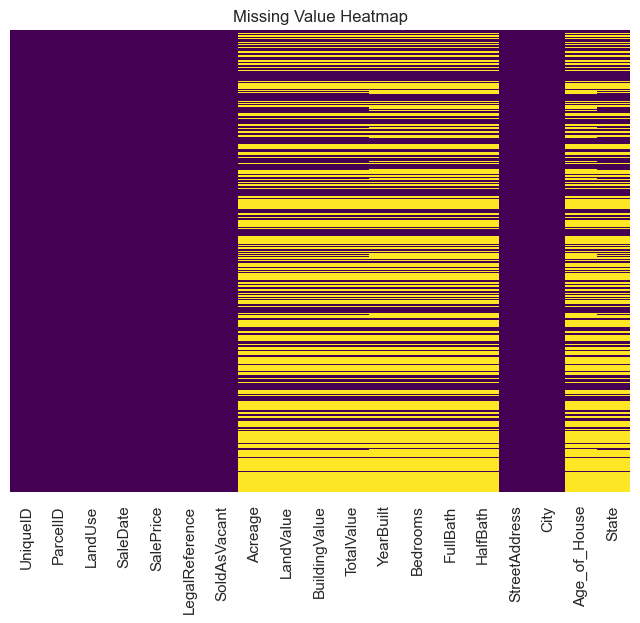

In [6]:
plt.figure(figsize=(8, 6))
sns.heatmap(raw_data.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Value Heatmap')
plt.show()

In [7]:
raw_data['LandUse'].unique()

array(['SINGLE FAMILY', 'RESIDENTIAL CONDO', 'VACANT RURAL LAND',
       'VACANT RES LAND', 'DUPLEX', 'VACANT RESIDENTIAL LAND', 'CHURCH',
       'ZERO LOT LINE', 'RESIDENTIAL COMBO/MISC', 'PARSONAGE',
       'OFFICE BLDG (ONE OR TWO STORIES)',
       'GREENBELT/RES\r\nGRRENBELT/RES', 'MOBILE HOME', 'PARKING LOT',
       'CLUB/UNION HALL/LODGE', 'TRIPLEX', 'VACANT ZONED MULTI FAMILY',
       'SPLIT CLASS', 'CONDO', 'QUADPLEX', 'LIGHT MANUFACTURING',
       'FOREST', 'CONVENIENCE MARKET WITHOUT GAS',
       'DORMITORY/BOARDING HOUSE', 'GREENBELT', 'DAY CARE CENTER',
       'METRO OTHER THAN OFC, SCHOOL,HOSP, OR PARK',
       'TERMINAL/DISTRIBUTION WAREHOUSE', 'NIGHTCLUB/LOUNGE',
       'RESTURANT/CAFETERIA', 'VACANT COMMERCIAL LAND',
       'CONDOMINIUM OFC  OR OTHER COM CONDO', 'STRIP SHOPPING CENTER',
       'VACANT RESIENTIAL LAND', 'APARTMENT: LOW RISE (BUILT SINCE 1960)',
       'ONE STORY GENERAL RETAIL STORE', 'NON-PROFIT CHARITABLE SERVICE',
       'SMALL SERVICE SHOP', 'MORTUAR

In [8]:
raw_data[raw_data.duplicated(subset=['StreetAddress'],keep='first')].sort_values(by='StreetAddress')

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,StreetAddress,City,Age_of_House,State
28852,54157.0,105 14 0P 001.00,RESIDENTIAL CONDO,2016-09-12,"R285,000.00",20160913-0095955,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NASHVILLE,NaN,NaN
28853,54158.0,105 14 0P 002.00,VACANT RESIDENTIAL LAND,2016-09-12,"R285,000.00",20160913-0095955,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NASHVILLE,NaN,NaN
17877,55919.0,090 08 0N 002.00,VACANT RESIDENTIAL LAND,2016-10-25,"R165,000.00",20161027-0113590,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NASHVILLE,NaN,NaN
12714,28041.0,081 11 0 536.00,VACANT RESIDENTIAL LAND,2015-03-06,35000.00,20150309-0019811,-1.0,0.04,1500.0,0.0,1500.0,NaN,NaN,NaN,NaN,0 12TH AVE N,NASHVILLE,NaN,TN
20149,37588.0,092 09 0 381.00,VACANT RESIDENTIAL LAND,2015-09-29,4400000.00,20151002-0100496,-1.0,0.13,20000.0,0.0,20000.0,NaN,NaN,NaN,NaN,0 35TH AVE N,NASHVILLE,NaN,TN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15022,21508.0,083 03 0 110.00,VACANT RESIDENTIAL LAND,2014-09-12,"R260,000.00",20140915-0084446,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PORTER RD,NASHVILLE,NaN,NaN
10459,21467.0,072 16 0D 002.00,RESIDENTIAL CONDO,2014-09-30,"R385,000.00",20141003-0091532,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PORTER RD,NASHVILLE,NaN,NaN
14687,14592.0,082 16 0L 004.00,RESIDENTIAL CONDO,2014-04-25,"R352,000.00",20140501-0036651,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RUSSELL ST,NASHVILLE,NaN,NaN
14685,17086.0,082 16 0L 003.00,RESIDENTIAL CONDO,2014-06-25,"R305,000.00",20140630-0057108,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RUSSELL ST,NASHVILLE,NaN,NaN


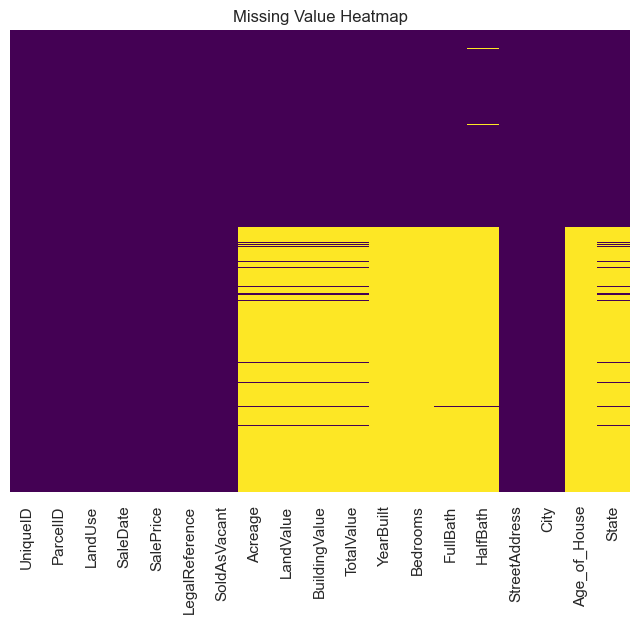

In [9]:
sorted_df = raw_data.sort_values(by='YearBuilt')
plt.figure(figsize=(8, 6))
sns.heatmap(sorted_df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Value Heatmap')
plt.show()

In [10]:
raw_data.isnull().sum()

UniqueID              0
ParcelID              0
LandUse               0
SaleDate              0
SalePrice             0
LegalReference        0
SoldAsVacant          0
Acreage           30404
LandValue         30404
BuildingValue     30404
TotalValue        30404
YearBuilt         32255
Bedrooms          32261
FullBath          32143
HalfBath          32274
StreetAddress         0
City                  0
Age_of_House      32255
State             30404
dtype: int64

In [11]:
raw_data[raw_data.duplicated(subset=['StreetAddress', 'ParcelID'], keep=False)]


,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,StreetAddress,City,Age_of_House,State
43,6993.0,015 14 0 060.00,SINGLE FAMILY,2013-08-20,"R145,000.00",20130821-0088382,0.0,0.98,30000.0,111200.0,141200.0,1996.0,3.0,2.0,0.0,3113 MILLIKEN DR,JOELTON,17.0,TN
44,43071.0,015 14 0 060.00,SINGLE FAMILY,2016-01-15,"R160,000.00",20160119-0004923,0.0,0.98,30000.0,111200.0,141200.0,1996.0,3.0,2.0,0.0,3113 MILLIKEN DR,JOELTON,20.0,TN
60,8903.0,018 00 0 164.00,VACANT RES LAND,2013-10-25,"R25,000.00",20131028-0111686,0.0,0.39,24000.0,175900.0,199900.0,2014.0,3.0,2.0,0.0,332 MONCRIEF AVE,GOODLETTSVILLE,-1.0,TN
61,16921.0,018 00 0 164.00,SINGLE FAMILY,2014-06-24,"R219,900.00",20140625-0055427,0.0,0.39,24000.0,175900.0,199900.0,2014.0,3.0,2.0,0.0,332 MONCRIEF AVE,GOODLETTSVILLE,0.0,TN
74,5807.0,018 07 0 045.00,SINGLE FAMILY,2013-07-26,"R75,000.00",20130730-0078963,0.0,0.45,28000.0,101900.0,132600.0,1957.0,3.0,1.0,0.0,202 LUCIEN RD,GOODLETTSVILLE,56.0,TN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56298,46338.0,187 09 0A 205.00,SINGLE FAMILY,2016-04-29,"R310,000.00",20160503-0043618,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2178 KIRKWALL DR,NOLENSVILLE,NaN,NaN
56300,12966.0,187 09 0A 207.00,SINGLE FAMILY,2014-03-21,"R244,275.00",20140324-0024137,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2174 KIRKWALL DR,NOLENSVILLE,NaN,NaN
56301,37558.0,187 09 0A 207.00,SINGLE FAMILY,2015-09-30,"R266,750.00",20151002-0100278,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2174 KIRKWALL DR,NOLENSVILLE,NaN,NaN
56352,1664.0,188 10 0A 054.00,SINGLE FAMILY,2013-04-19,"R137,000.00",20130425-0040972,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025 OAK TRAIL DR,NOLENSVILLE,NaN,NaN


In [12]:
raw_data[raw_data['LandUse'].str.contains('land', case=False)].isnull().sum()

UniqueID             0
ParcelID             0
LandUse              0
SaleDate             0
SalePrice            0
LegalReference       0
SoldAsVacant         0
Acreage           3410
LandValue         3410
BuildingValue     3410
TotalValue        3410
YearBuilt         4612
Bedrooms          4607
FullBath          4500
HalfBath          4521
StreetAddress        0
City                 0
Age_of_House      4612
State             3410
dtype: int64

In [5]:
pd.options.display.max_rows = 500

In [6]:
df = raw_data.copy()
null_counts = df.groupby(['LandUse','City'])['YearBuilt'].apply(lambda x: x.isnull().sum()).reset_index(name='TotalMissingValues')
value_counts = df.groupby(['LandUse','City'])['LandUse'].apply(lambda x: x.count()).reset_index(name='ValueCount')
null_counts['ValueCount'] = value_counts['ValueCount']
null_counts

,LandUse,City,TotalMissingValues,ValueCount
0,APARTMENT: LOW RISE (BUILT SINCE 1960),NASHVILLE,0,2
1,CHURCH,BRENTWOOD,0,1
2,CHURCH,GOODLETTSVILLE,0,2
3,CHURCH,MADISON,0,3
4,CHURCH,NASHVILLE,2,27
5,CLUB/UNION HALL/LODGE,MADISON,0,1
6,CONDO,ANTIOCH,2,2
7,CONDO,BRENTWOOD,8,8
8,CONDO,HERMITAGE,4,4
9,CONDO,MADISON,2,2


In [7]:
condo_addresses = raw_data[raw_data['LandUse'].str.contains('condo', case=False)]['StreetAddress']
df[df['StreetAddress'].isin(condo_addresses)].sort_values(by='StreetAddress')

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,StreetAddress,City,Age_of_House,State
33033,2979.0,118 01 0Q 106.00,RESIDENTIAL CONDO,2013-05-28,"R195,000.00",20130603-0055710,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12TH AVE S,NASHVILLE,NaN,NaN
26895,2868.0,104 11 0U 003.00,RESIDENTIAL CONDO,2013-05-30,"R450,000.00",20130531-0055044,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ACKLEN AVE,NASHVILLE,NaN,NaN
26441,4063.0,104 06 0Q 001.00,RESIDENTIAL CONDO,2013-06-25,"R591,800.00",20130711-0071776,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MARLBOROUGH AVE,NASHVILLE,NaN,NaN
28853,54158.0,105 14 0P 002.00,VACANT RESIDENTIAL LAND,2016-09-12,"R285,000.00",20160913-0095955,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NASHVILLE,NaN,NaN
28852,54157.0,105 14 0P 001.00,RESIDENTIAL CONDO,2016-09-12,"R285,000.00",20160913-0095955,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NASHVILLE,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14685,17086.0,082 16 0L 003.00,RESIDENTIAL CONDO,2014-06-25,"R305,000.00",20140630-0057108,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RUSSELL ST,NASHVILLE,NaN,NaN
14687,14592.0,082 16 0L 004.00,RESIDENTIAL CONDO,2014-04-25,"R352,000.00",20140501-0036651,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RUSSELL ST,NASHVILLE,NaN,NaN
14683,17085.0,082 16 0L 001.00,RESIDENTIAL CONDO,2014-06-13,"R352,000.00",20140619-0053681,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RUSSELL ST,NASHVILLE,NaN,NaN
32290,13116.0,117 08 0M 002.00,RESIDENTIAL CONDO,2014-03-28,"R195,000.00",20140404-0028420,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,STOKES LN,NASHVILLE,NaN,NaN


In [8]:
singlefam_addresses = raw_data[raw_data['LandUse'].str.contains('family', case=False)]['StreetAddress']
df[df['StreetAddress'].isin(singlefam_addresses)].sort_values(by='StreetAddress')

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,StreetAddress,City,Age_of_House,State
2376,10959.0,044 10 0 002.00,VACANT ZONED MULTI FAMILY,2013-12-16,12000.00,20131223-0129055,-1.0,0.34,7700.0,0.0,7700.0,NaN,NaN,NaN,NaN,0 FOWLER ST,OLD HICKORY,NaN,TN
3598,45368.0,052 05 0A 219.00,SINGLE FAMILY,2016-03-04,"R139,500.00",20160307-0021738,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0 IDLEWILD CT,NASHVILLE,NaN,NaN
4320,3498.0,053 12 0 163.00,SINGLE FAMILY,2013-05-30,"R690,000.00",20130531-0054808,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0 LAKESHORE DR,OLD HICKORY,NaN,NaN
52052,44687.0,172 14 0B 192.00,SINGLE FAMILY,2016-03-31,"R360,000.00",20160401-0031156,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0 RAVENS GLN,NASHVILLE,NaN,NaN
1207,45297.0,041 01 0A 061.00,SINGLE FAMILY,2016-03-31,"R195,600.00",20160404-0031660,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0 RYAN ALLEN CIR,NASHVILLE,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38204,42587.0,133 01 0 052.00,SINGLE FAMILY,2016-01-15,"R160,000.00",20160120-0005962,0.0,0.10,16000.0,73000.0,91400.0,1930.0,2.0,1.0,0.0,PATTERSON ST,NASHVILLE,86.0,TN
38290,17576.0,133 01 0 351.00,VACANT RESIDENTIAL LAND,2014-07-14,"R220,000.00",20140716-0062764,0.0,0.19,16000.0,308400.0,324400.0,2016.0,4.0,3.0,0.0,PATTERSON ST,NASHVILLE,-2.0,TN
36348,43894.0,130 03 0 176.00,SINGLE FAMILY,2016-02-22,"R398,500.00",20160222-0016572,0.0,0.49,394900.0,38700.0,433600.0,1938.0,2.0,1.0,0.0,SUNNYBROOK DR,NASHVILLE,78.0,TN
15691,44246.0,083 07 0Z 001.00,SINGLE FAMILY,2016-02-11,"R189,900.00",20160222-0016885,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WASHINGTON AVE,NASHVILLE,NaN,NaN


In [9]:
df.groupby('City').mean()

C:\Users\27722\AppData\Local\Temp\ipykernel_14872\586796454.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('City').mean()


,UniqueID,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,FullBath,HalfBath,Age_of_House
City,,,,,,,,,,,
ANTIOCH,29338.401209,-0.171810,0.430146,2.449389e+04,86696.390169,1.117424e+05,1983.115294,3.006275,1.871473,0.261755,31.545098
BELLEVUE,24781.000000,0.000000,4.130000,1.240000e+04,0.000000,1.240000e+04,NaN,NaN,NaN,NaN,NaN
BRENTWOOD,26821.086675,-0.104953,1.320098,1.527049e+05,277834.803922,4.344760e+05,1981.379121,3.515957,2.851852,0.449735,33.131868
FRANKLIN,6125.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GOODLETTSVILLE,29271.454422,-0.172789,0.746864,3.014280e+04,115126.694915,1.476220e+05,1973.299349,3.110629,1.811688,0.236443,41.286334
HERMITAGE,28198.397313,-0.053743,0.680701,2.760326e+04,101828.246445,1.312144e+05,1977.295610,3.200976,1.796296,0.311891,37.320976
JOELTON,30878.818182,0.000000,1.032727,3.000000e+04,102700.000000,1.366182e+05,1977.545455,3.181818,1.454545,0.000000,37.181818
MADISON,32251.057237,-0.123936,0.625309,2.499150e+04,91156.073338,1.187321e+05,1964.202449,2.932190,1.619821,0.147967,50.462041
MOUNT JULIET,29100.877778,-0.283333,6.848750,9.712500e+04,109425.000000,2.132000e+05,1964.714286,3.571429,2.142857,0.142857,49.571429


In [10]:
df['SaleDate'] = pd.to_datetime(df['SaleDate'])
df['SaleYear'] = df['SaleDate'].dt.year
df['SaleMonth'] = df['SaleDate'].dt.month
df['SaleDay'] = df['SaleDate'].dt.day
df['SalePrice'] = df['SalePrice'].str.replace(',', '').str.replace('R', '').astype(float)
df['SoldAsVacant'] = (df['SoldAsVacant']+1).astype(int)

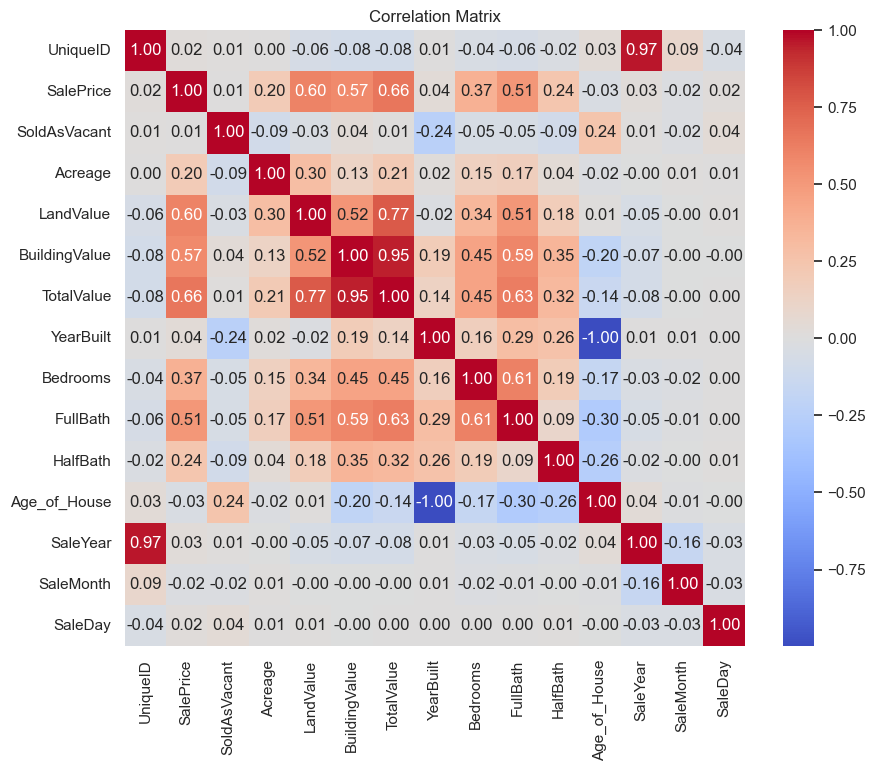

In [19]:
correlation_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56373 entries, 0 to 56372
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   UniqueID        56373 non-null  float64       
 1   ParcelID        56373 non-null  object        
 2   LandUse         56373 non-null  object        
 3   SaleDate        56373 non-null  datetime64[ns]
 4   SalePrice       56373 non-null  float64       
 5   LegalReference  56373 non-null  object        
 6   SoldAsVacant    56373 non-null  int32         
 7   Acreage         25969 non-null  float64       
 8   LandValue       25969 non-null  float64       
 9   BuildingValue   25969 non-null  float64       
 10  TotalValue      25969 non-null  float64       
 11  YearBuilt       24118 non-null  float64       
 12  Bedrooms        24112 non-null  float64       
 13  FullBath        24230 non-null  float64       
 14  HalfBath        24099 non-null  float64       
 15  St

<Figure size 800x500 with 0 Axes>

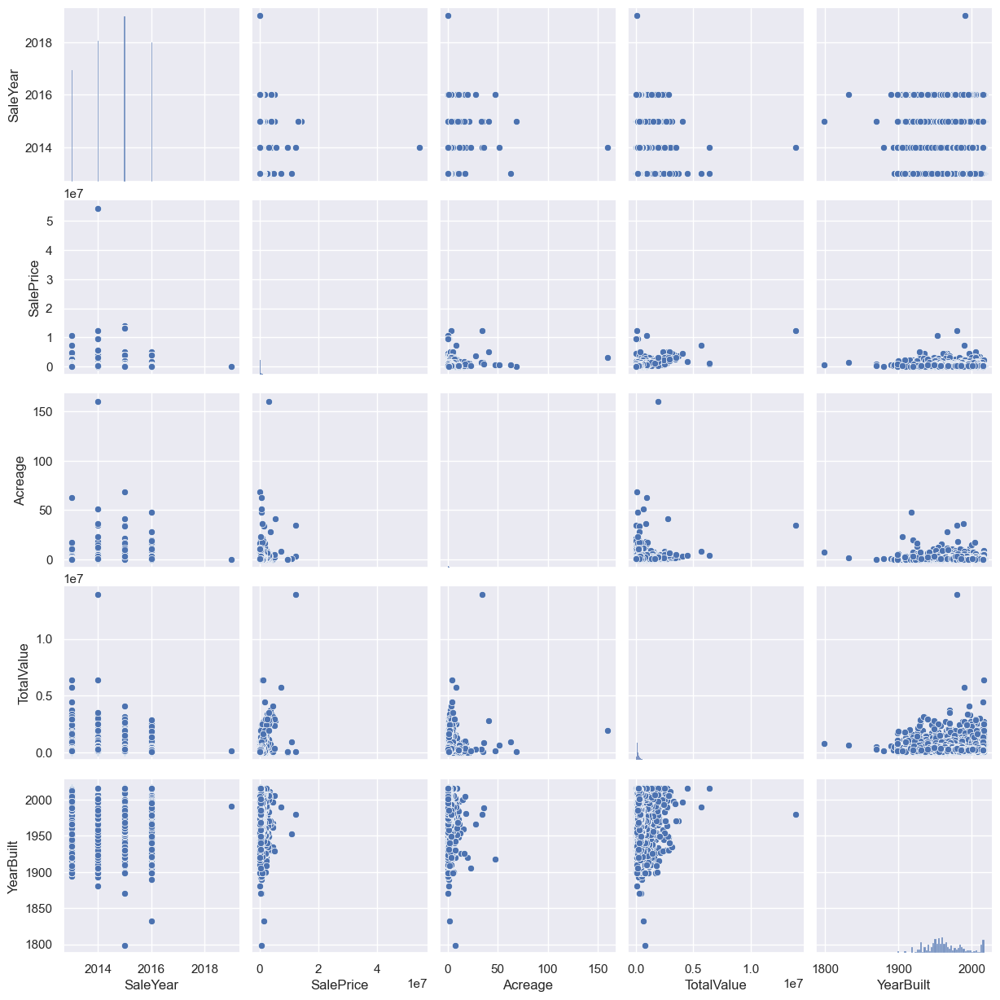

In [21]:
plt.figure(figsize=(8,5))
sns.pairplot(data=df,vars=['SaleYear','SalePrice','Acreage','TotalValue','YearBuilt'])
plt.show()

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


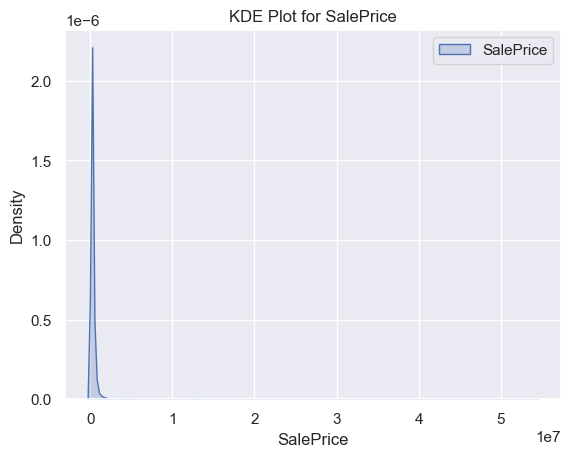

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


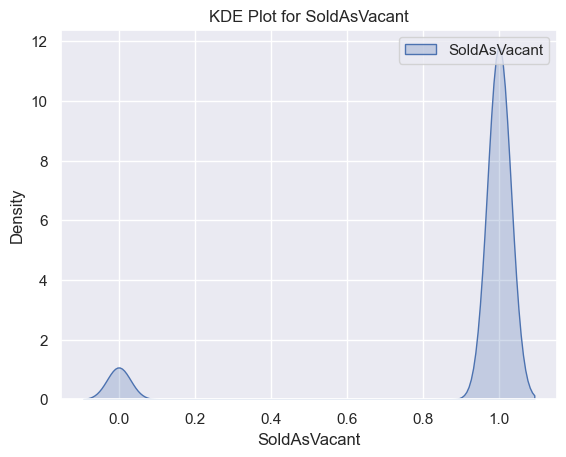

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


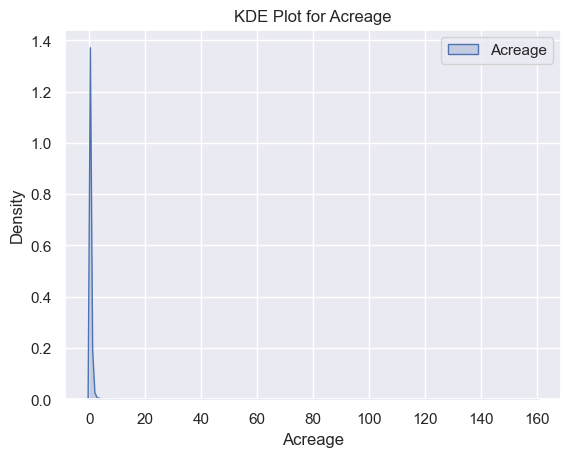

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


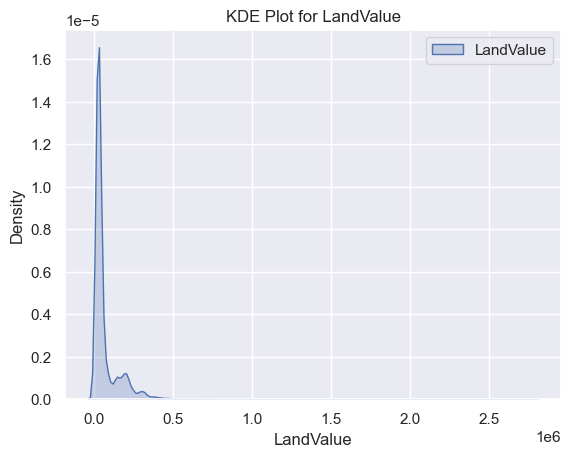

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


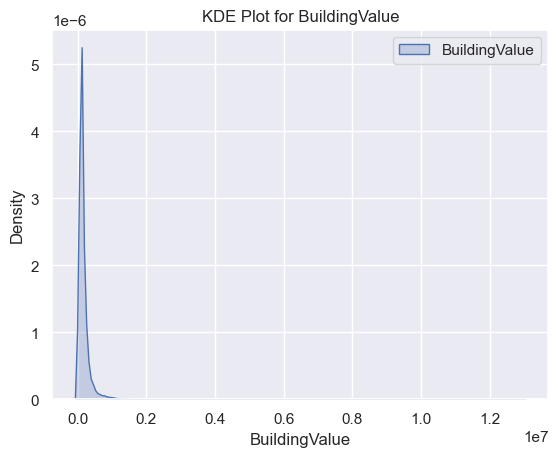

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


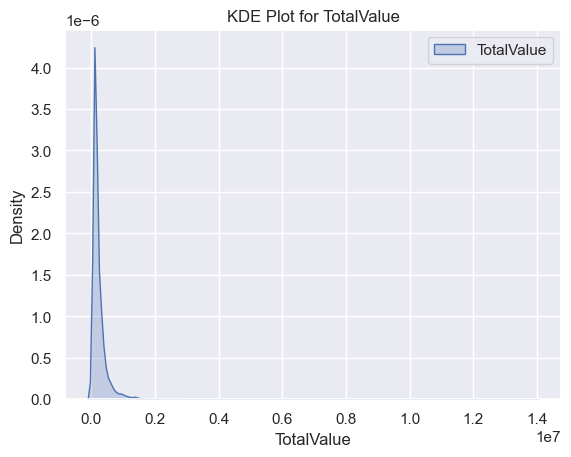

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


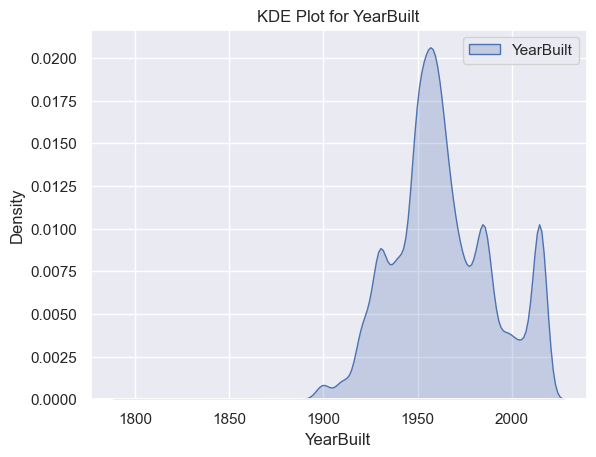

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


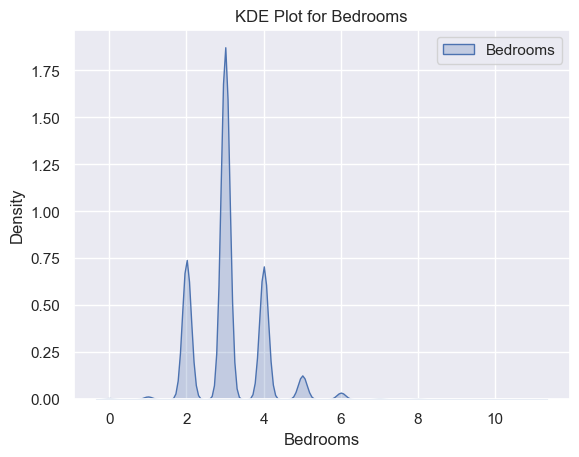

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


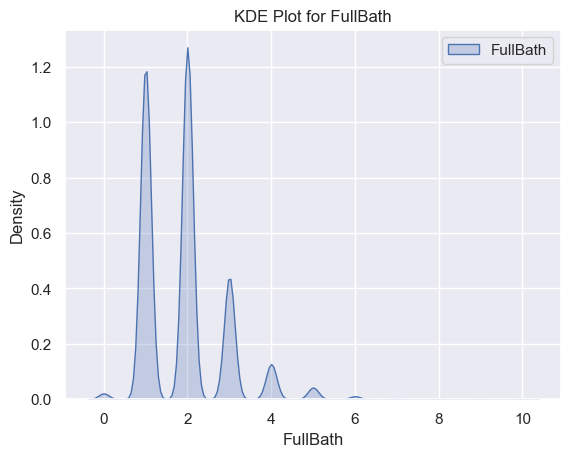

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


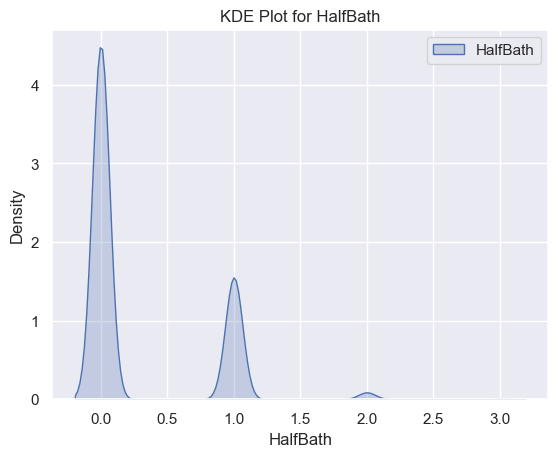

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


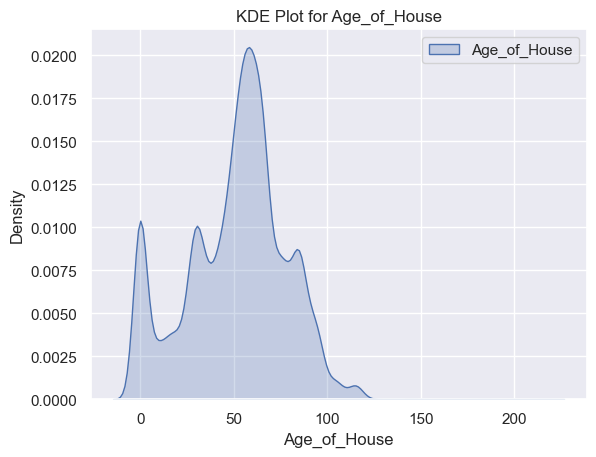

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


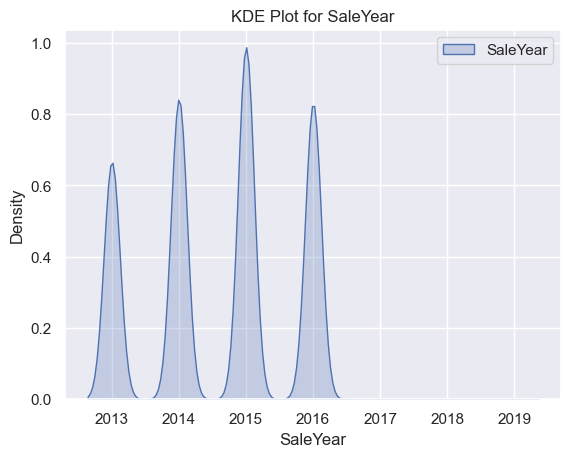

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


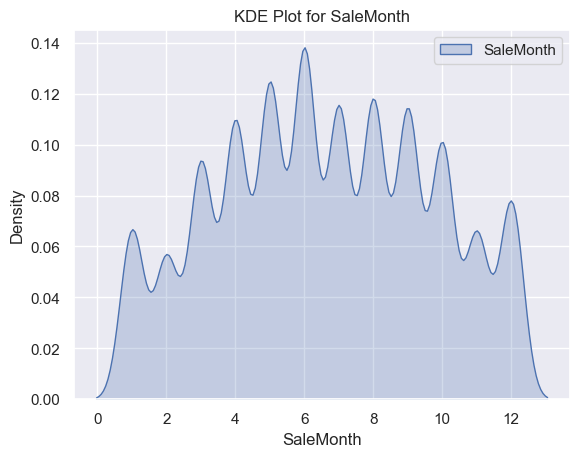

C:\Users\27722\AppData\Local\Temp\ipykernel_24248\1779454009.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(eda_df[column], label=column, shade=True)


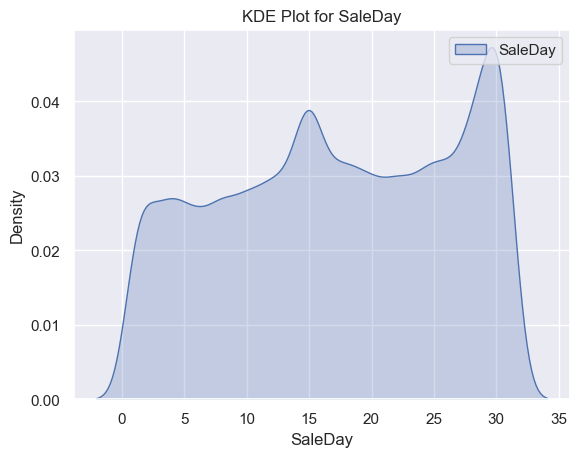

In [22]:
numerical_columns = df.select_dtypes(include=['float64','int32', 'int64']).columns
eda_df = df[numerical_columns].copy().drop(columns ='UniqueID')
for column in eda_df.columns:
    sns.kdeplot(eda_df[column], label=column, fill=True)
    plt.title(f'KDE Plot for {column}')
    plt.legend()
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


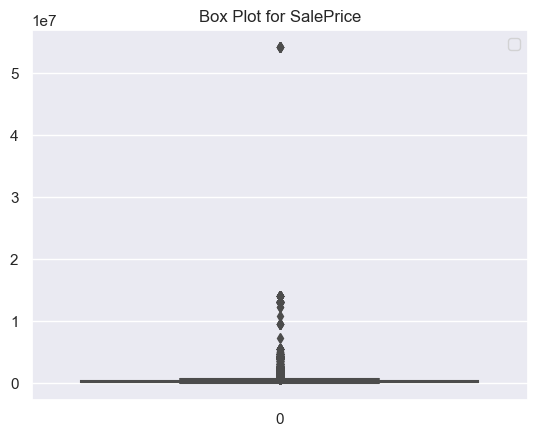

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


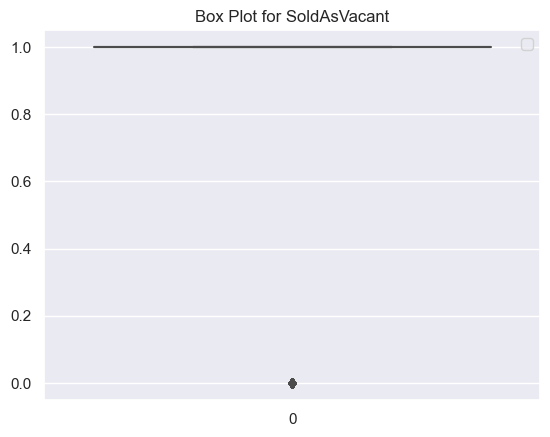

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


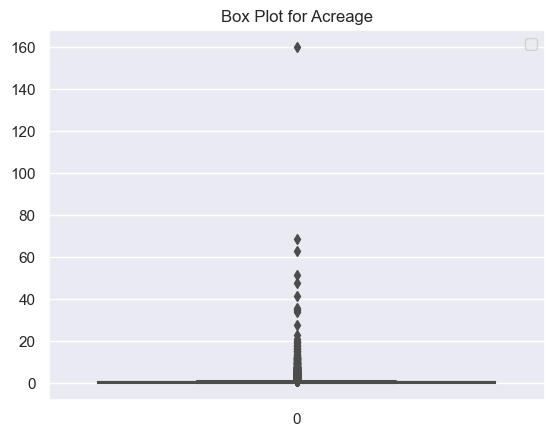

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


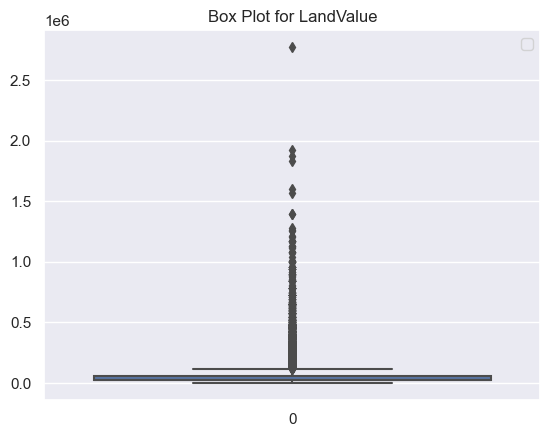

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


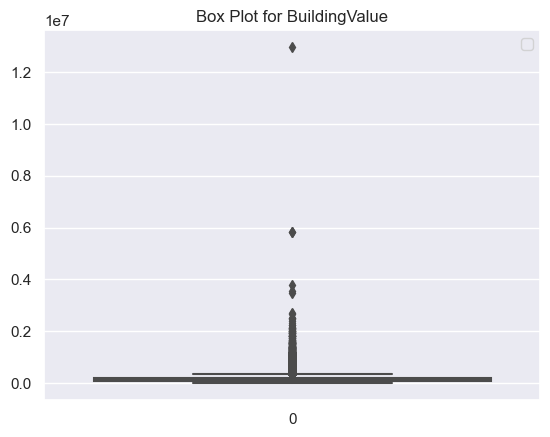

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


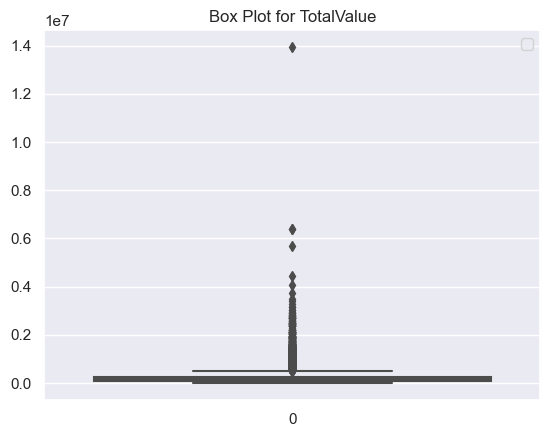

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


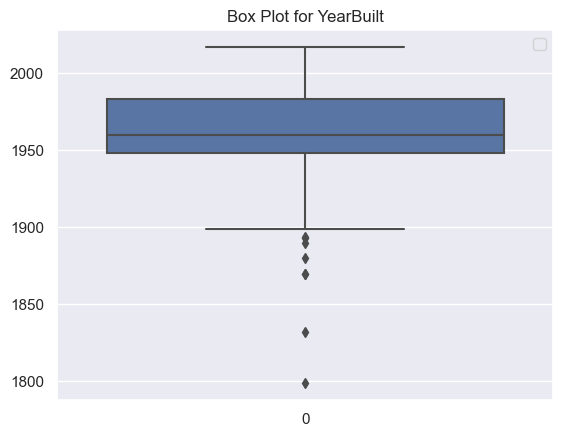

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


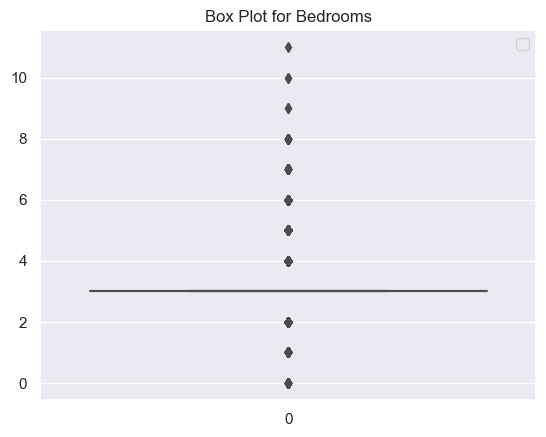

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


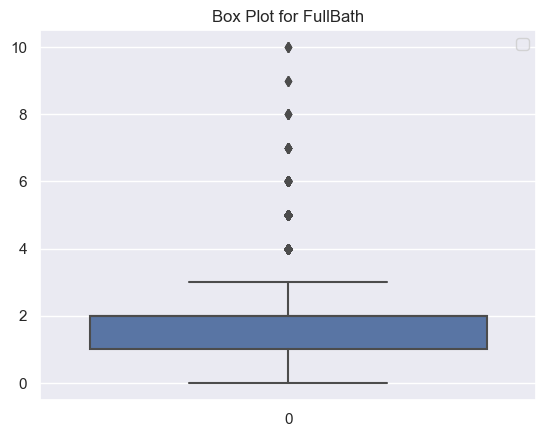

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


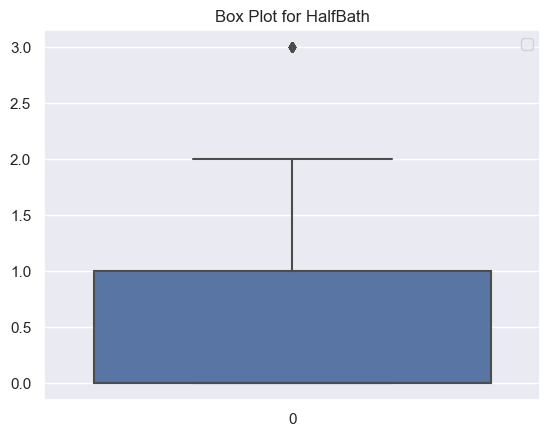

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


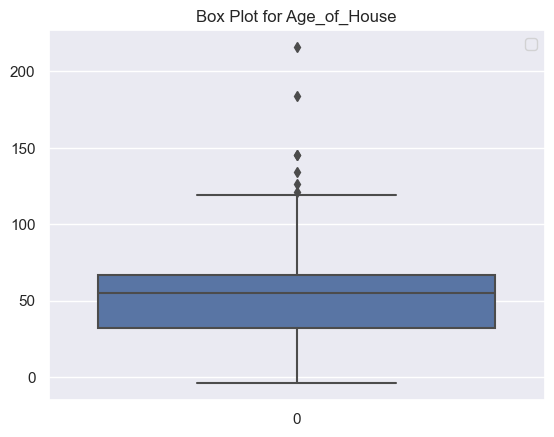

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


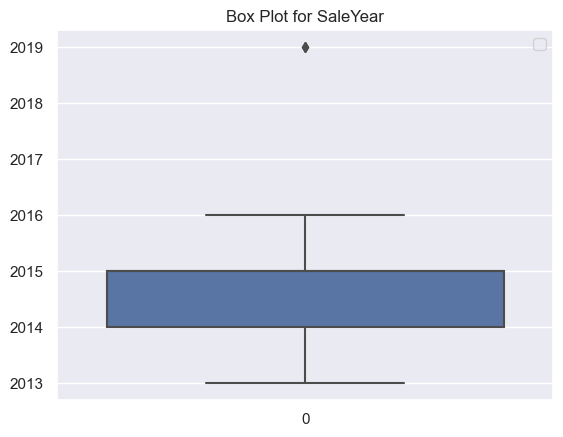

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


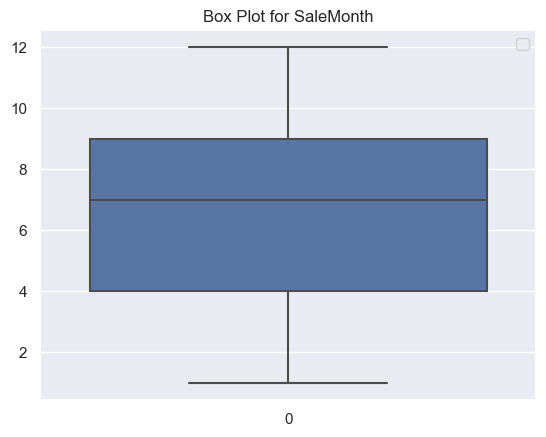

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


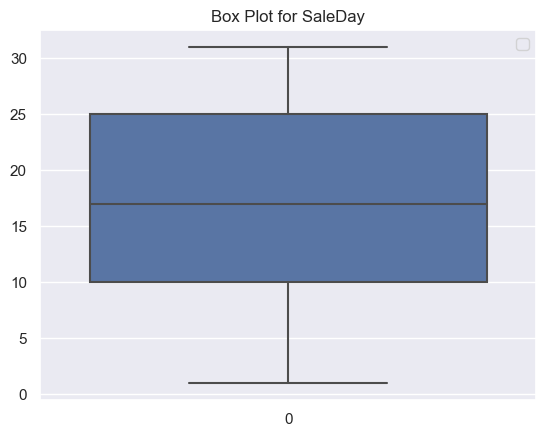

In [23]:
for column in eda_df.columns:
    sns.boxplot(eda_df[column])
    plt.title(f'Box Plot for {column}')
    plt.legend()
    plt.show()

c:\Users\27722\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\Users\27722\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


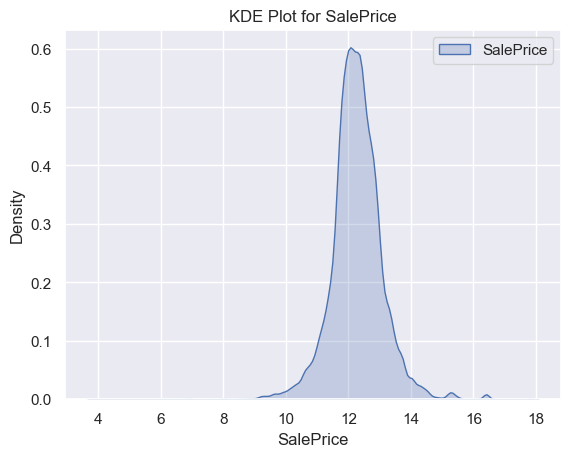

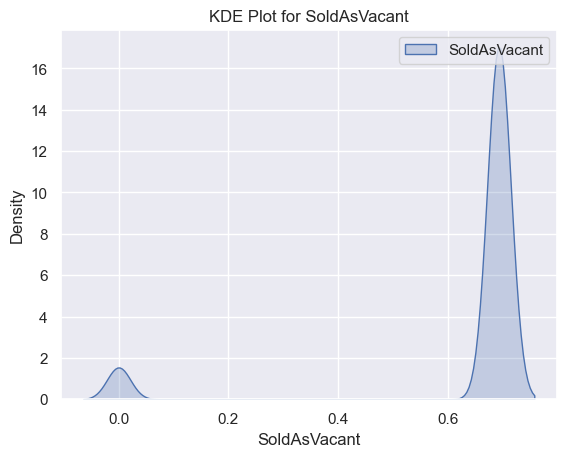

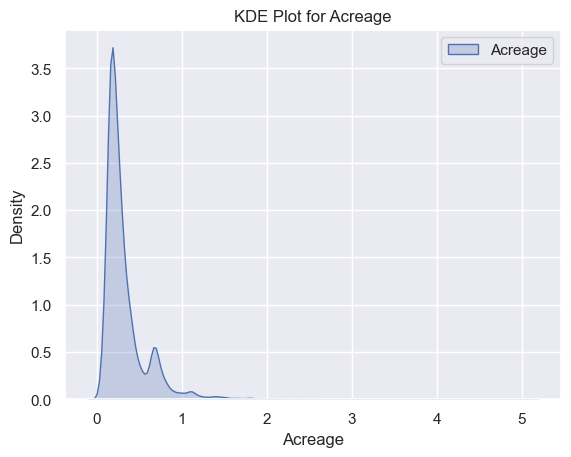

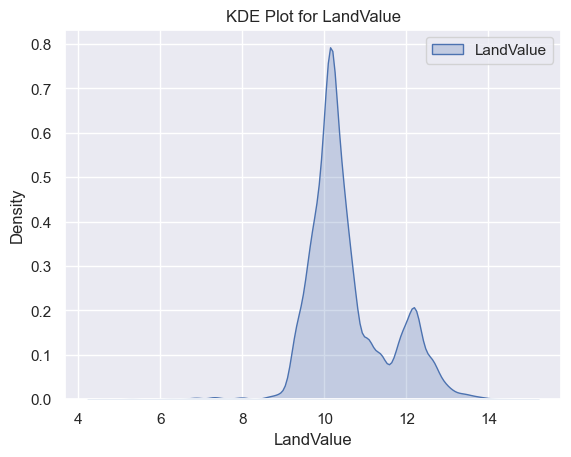

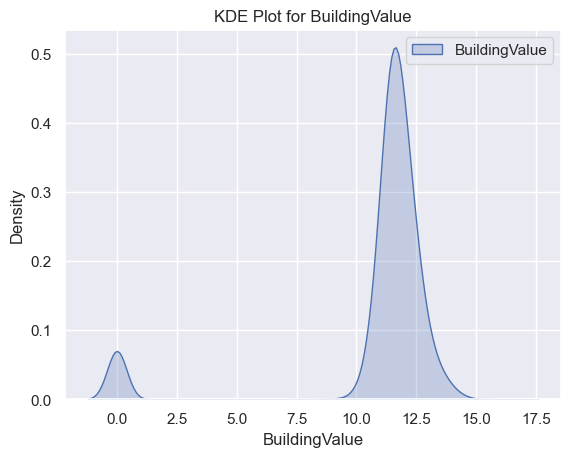

...

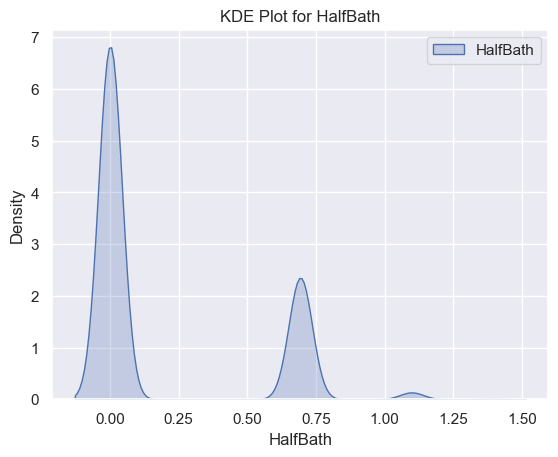

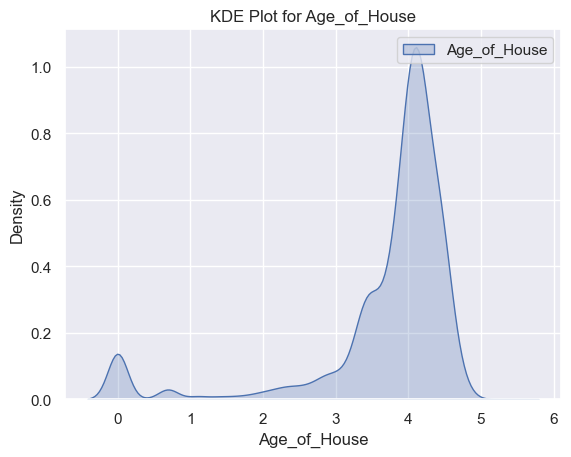

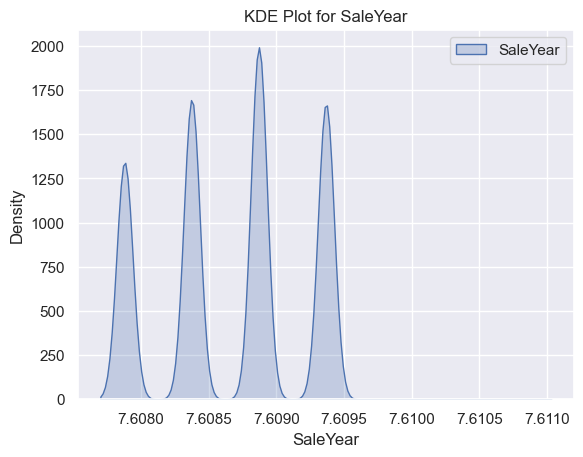

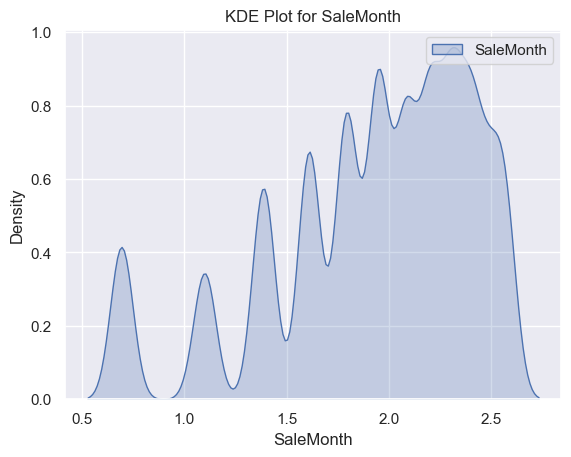

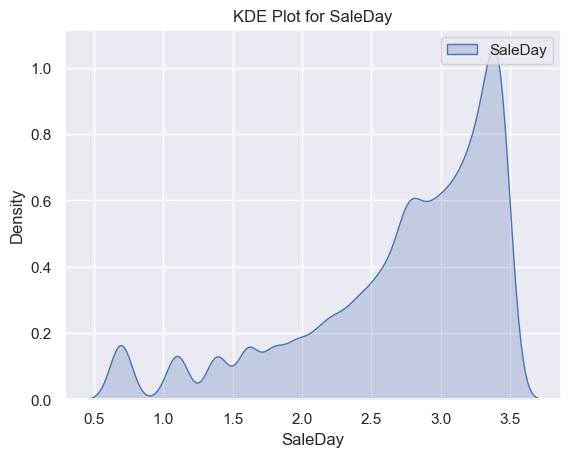

In [25]:
numerical_columns = df.select_dtypes(include=['float64','int32', 'int64']).columns
log_eda_df = np.log(df[numerical_columns].copy().drop(columns ='UniqueID')+1)
for column in log_eda_df.columns:
    sns.kdeplot(log_eda_df[column], label=column, fill=True)
    plt.title(f'KDE Plot for {column}')
    plt.legend()
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


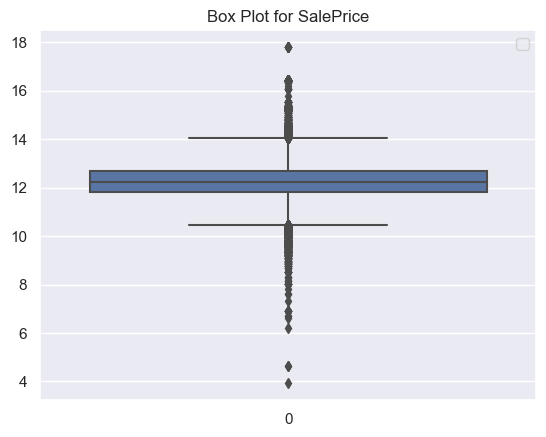

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


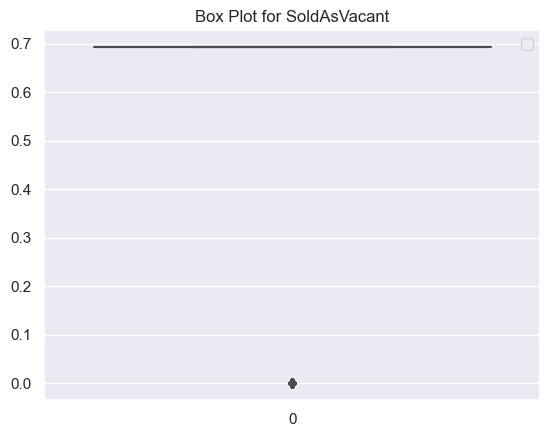

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


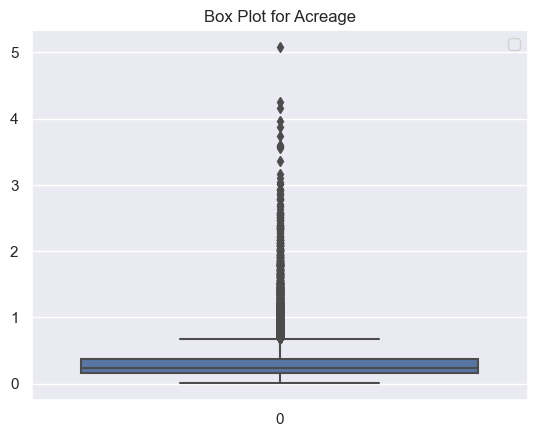

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


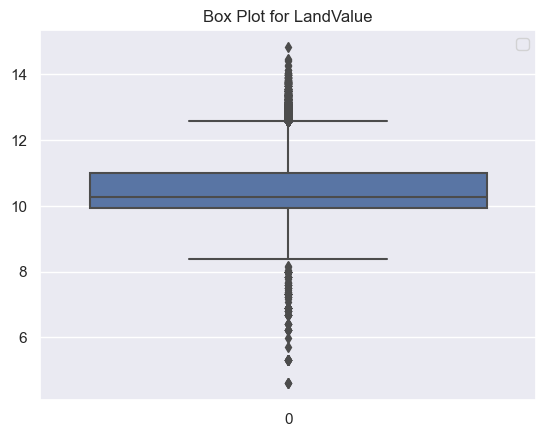

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


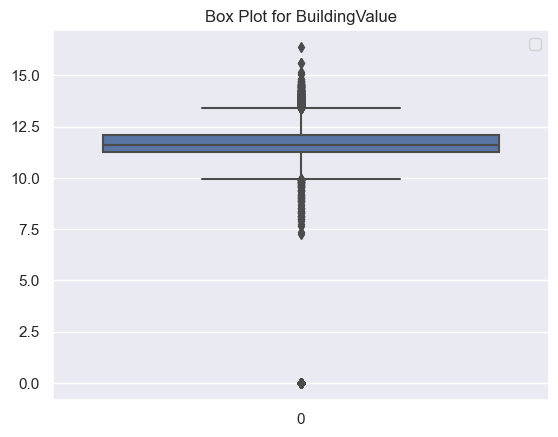

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


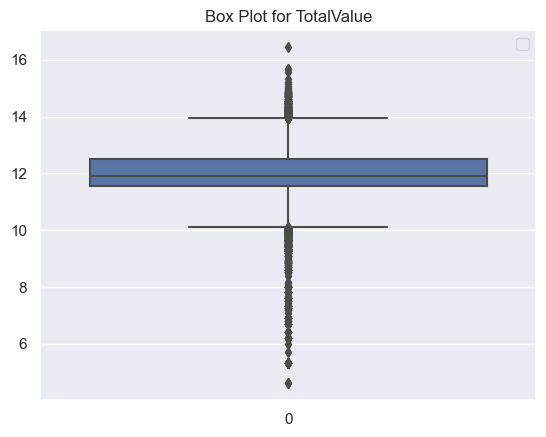

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


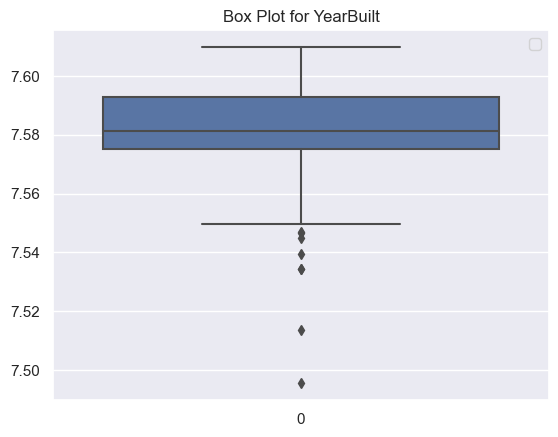

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


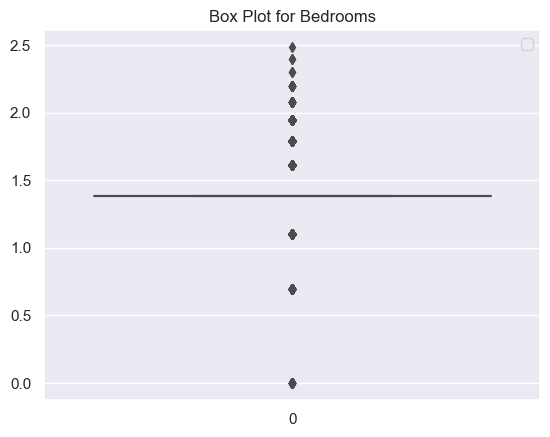

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


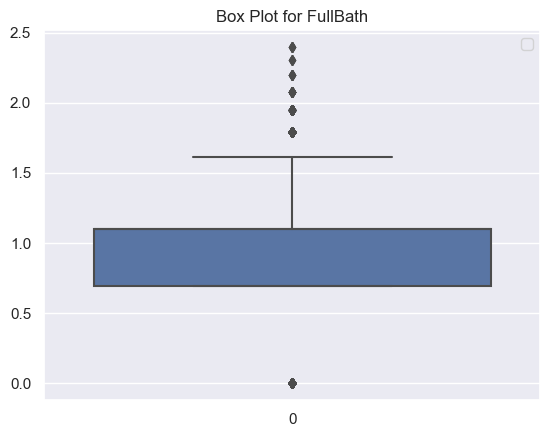

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


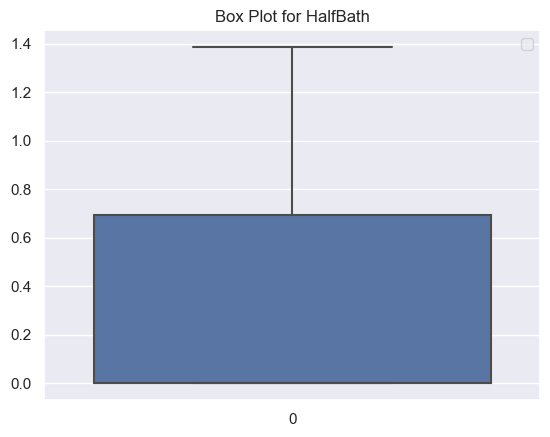

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


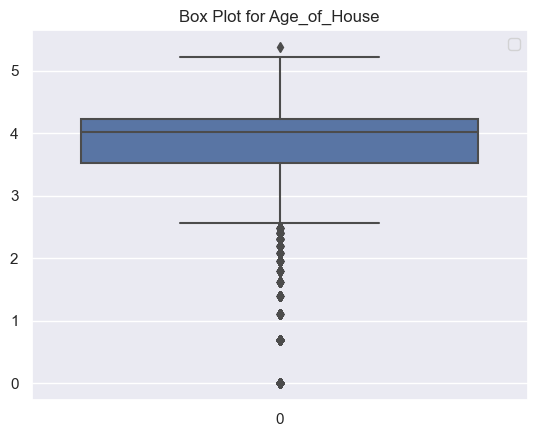

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


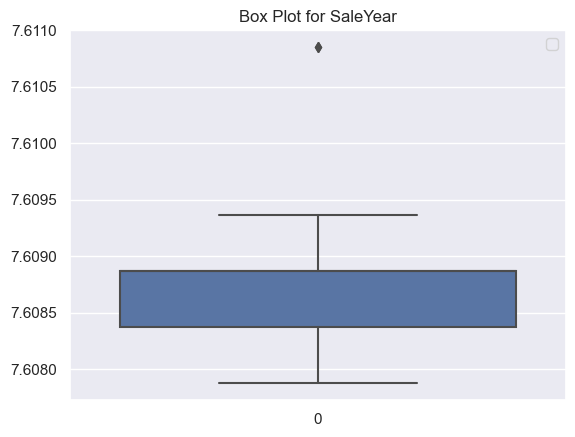

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


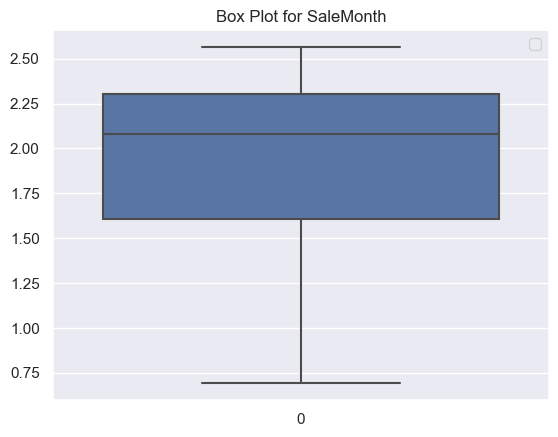

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


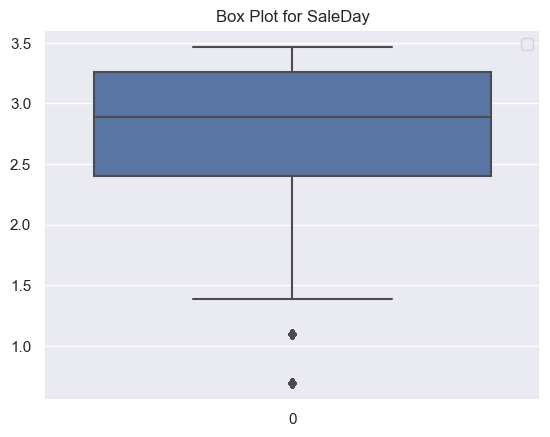

In [26]:
for column in log_eda_df.columns:
    sns.boxplot(log_eda_df[column])
    plt.title(f'Box Plot for {column}')
    plt.legend()
    plt.show()

<Figure size 800x500 with 0 Axes>

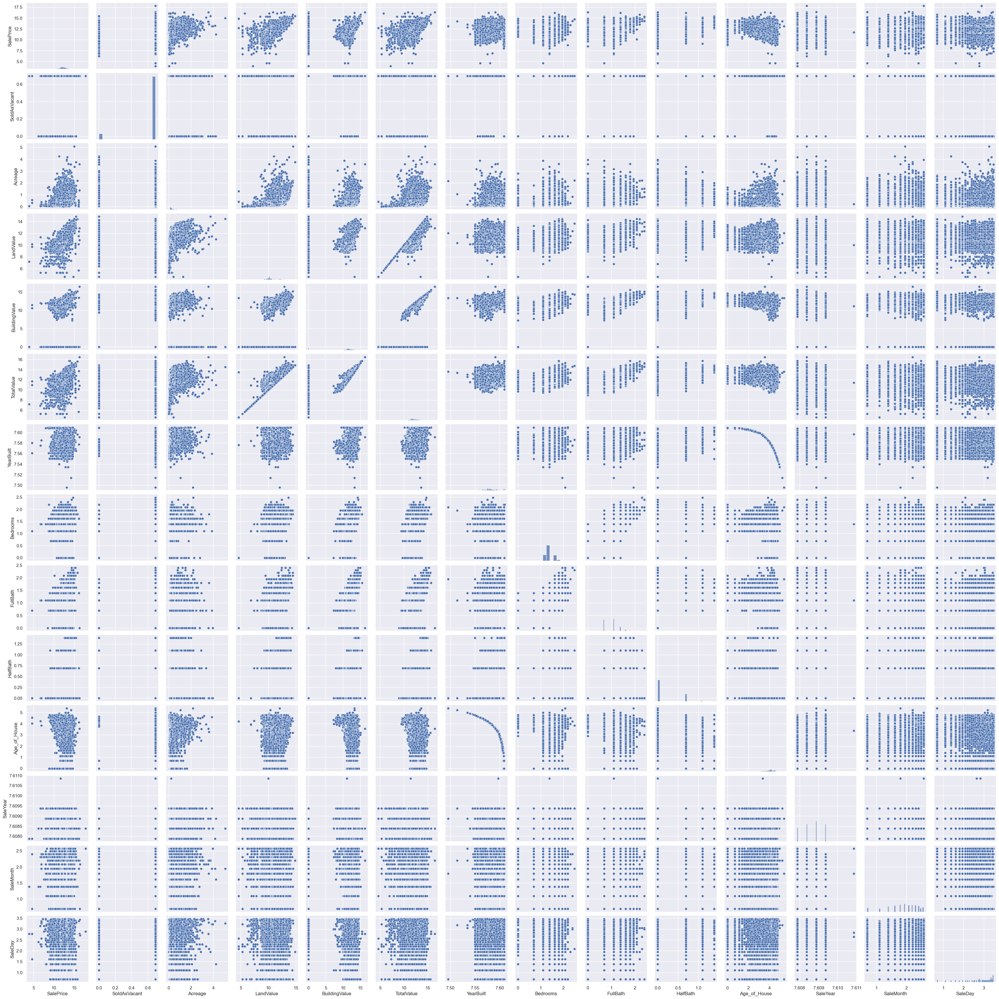

In [ ]:
plt.figure(figsize=(8,5))
sns.pairplot(data=log_eda_df)
plt.show()

In [11]:
df.sort_values(by='SaleDate', inplace=True)
df['PreviousSales'] = df.groupby(['StreetAddress', 'ParcelID']).cumcount()
df['PreviousSales'] += 1
df

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,...,FullBath,HalfBath,StreetAddress,City,Age_of_House,State,SaleYear,SaleMonth,SaleDay,PreviousSales
46767,204.0,159 00 0 261.00,SINGLE FAMILY,2013-01-02,1365000.0,20130104-0001158,1,1.99,280800.0,1184700.0,...,4.0,1.0,5442 GRANNY WHITE PIKE,BRENTWOOD,7.0,TN,2013,1,2,1
18829,217.0,091 07 0 171.00,SINGLE FAMILY,2013-01-02,50000.0,20130103-0001026,1,0.17,45000.0,48200.0,...,1.0,0.0,4806 KENTUCKY AVE,NASHVILLE,95.0,TN,2013,1,2,1
41619,189.0,142 09 0H 065.00,RESIDENTIAL CONDO,2013-01-02,135000.0,20130111-0003886,1,NaN,NaN,NaN,...,NaN,NaN,9135 SAWYER BROWN RD,NASHVILLE,NaN,NaN,2013,1,2,1
28455,122.0,105 13 0 349.00,SINGLE FAMILY,2013-01-02,225000.0,20130107-0001749,1,0.18,140000.0,83400.0,...,1.0,0.0,924 WALDKIRCH AVE,NASHVILLE,73.0,TN,2013,1,2,1
1502,251.0,042 07 0A 129.00,SINGLE FAMILY,2013-01-02,51200.0,20130103-0000637,1,NaN,NaN,NaN,...,NaN,NaN,585 HERITAGE LN,MADISON,NaN,NaN,2013,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24579,55600.0,103 02 0K 002.00,RESIDENTIAL CONDO,2016-10-31,409900.0,20161101-0115561,1,NaN,NaN,NaN,...,NaN,NaN,5614 BURGESS AVE,NASHVILLE,NaN,NaN,2016,10,31,1
3081,56056.0,050 16 0A 013.00,SINGLE FAMILY,2016-10-31,160000.0,20161107-0117668,1,NaN,NaN,NaN,...,NaN,NaN,409 VAILVIEW DR,NASHVILLE,NaN,NaN,2016,10,31,1
51720,55470.0,172 12 0B 220.00,SINGLE FAMILY,2016-10-31,245000.0,20161101-0115596,1,NaN,NaN,NaN,...,NaN,NaN,604 COBBLE CT,NASHVILLE,NaN,NaN,2016,10,31,1
50621,53704.0,165 13 0A 057.00,SINGLE FAMILY,2019-05-16,118500.0,20160824-0088639,1,NaN,NaN,NaN,...,NaN,NaN,4501 STONEVIEW DR,ANTIOCH,NaN,NaN,2019,5,16,1


In [12]:
df['PreviousSales'].value_counts()

1    50609
2     5397
3      345
4       22
Name: PreviousSales, dtype: int64

In [13]:
df.groupby(['SaleYear', 'SaleMonth'])['SalePrice'].mean().pct_change().reset_index()

,SaleYear,SaleMonth,SalePrice
0,2013,1,NaN
1,2013,2,0.066812
2,2013,3,-0.019554
3,2013,4,-0.008518
4,2013,5,0.068629
5,2013,6,0.146490
6,2013,7,-0.174131
7,2013,8,0.085727
8,2013,9,-0.038870
9,2013,10,-0.018525


In [14]:
df.groupby(['SaleYear'])['SalePrice'].mean().pct_change().reset_index()

,SaleYear,SalePrice
0,2013,NaN
1,2014,0.367059
2,2015,0.196154
3,2016,-0.247202
4,2019,-0.606406


In [16]:
df['MonthlyInflation'] = df.groupby(['SaleYear', 'SaleMonth'])['SalePrice'].transform('mean').pct_change()
df['AnnualInflation'] = df.groupby(['SaleYear'])['SalePrice'].transform('mean').pct_change()
df['AnnualAvgSalePrice'] = df.groupby(['SaleYear'])['SalePrice'].transform('mean')
df['MonthlyAvgSalePrice'] = df.groupby(['SaleYear', 'SaleMonth'])['SalePrice'].transform('mean')
df['AnnualAvgTotalValue'] = df.groupby(['SaleYear'])['TotalValue'].transform('mean')
df['MonthlyAvgTotalValue'] = df.groupby(['SaleYear', 'SaleMonth'])['TotalValue'].transform('mean')
df['CityAnnualAvgTotalValue'] = df.groupby(['City', 'SaleYear'])['TotalValue'].transform('mean')
df['CityMonthlyAvgTotalValue'] = df.groupby(['City', 'SaleYear', 'SaleMonth'])['TotalValue'].transform('mean')
df['ValueDiffFromAnnualAvg'] = df['TotalValue'] - df['AnnualAvgTotalValue']
df['ValueDiffFromMonthlyAvg'] = df['TotalValue'] - df['MonthlyAvgTotalValue']
df['ValueDiffFromCityAnnualAvg'] = df['TotalValue'] - df['CityAnnualAvgTotalValue']
df['ValueDiffFromCityMonthlyAvg'] = df['TotalValue'] - df['CityMonthlyAvgTotalValue']
df['CityAnnualAvgSalePrice'] = df.groupby(['City', 'SaleYear'])['SalePrice'].transform('mean')
df['CityMonthlyAvgSalePrice'] = df.groupby(['City', 'SaleYear', 'SaleMonth'])['SalePrice'].transform('mean')
df['IntrinsicValue'] = df['TotalValue'] - (df['BuildingValue'] + df['LandValue'])
df['TotalRooms'] = df['Bedrooms'] + df['FullBath'] + 0.5*df['HalfBath']
df['ValueperRoom'] = df['TotalValue']/df['TotalRooms']
df['ValuePerAcre'] = df['TotalValue']/df['Acreage']
df['CityAvgAcre'] = df.groupby('City')['Acreage'].transform('mean')
df

,UniqueID,ParcelID,LandUse,SaleDate,SalePrice,LegalReference,SoldAsVacant,Acreage,LandValue,BuildingValue,...,ValueDiffFromMonthlyAvg,ValueDiffFromCityAnnualAvg,ValueDiffFromCityMonthlyAvg,CityAnnualAvgSalePrice,CityMonthlyAvgSalePrice,IntrinsicValue,TotalRooms,ValueperRoom,ValuePerAcre,CityAvgAcre
46767,204.0,159 00 0 261.00,SINGLE FAMILY,2013-01-02,1365000.0,20130104-0001158,1,1.99,280800.0,1184700.0,...,1.205211e+06,1.004302e+06,0.000000,292749.619048,567561.538462,0.0,8.5,172411.764706,7.364322e+05,1.320098
18829,217.0,091 07 0 171.00,SINGLE FAMILY,2013-01-02,50000.0,20130103-0001026,1,0.17,45000.0,48200.0,...,-1.670888e+05,-1.906752e+05,-183425.433526,261786.504879,232152.929032,0.0,4.0,23300.000000,5.482353e+05,0.465064
41619,189.0,142 09 0H 065.00,RESIDENTIAL CONDO,2013-01-02,135000.0,20130111-0003886,1,NaN,NaN,NaN,...,NaN,NaN,NaN,261786.504879,232152.929032,NaN,NaN,NaN,NaN,0.465064
28455,122.0,105 13 0 349.00,SINGLE FAMILY,2013-01-02,225000.0,20130107-0001749,1,0.18,140000.0,83400.0,...,-1.508883e+04,-3.867523e+04,-31425.433526,261786.504879,232152.929032,21800.0,3.0,81733.333333,1.362222e+06,0.465064
1502,251.0,042 07 0A 129.00,SINGLE FAMILY,2013-01-02,51200.0,20130103-0000637,1,NaN,NaN,NaN,...,NaN,NaN,NaN,111732.901198,96256.875000,NaN,NaN,NaN,NaN,0.625309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24579,55600.0,103 02 0K 002.00,RESIDENTIAL CONDO,2016-10-31,409900.0,20161101-0115561,1,NaN,NaN,NaN,...,NaN,NaN,NaN,341080.548150,375432.561614,NaN,NaN,NaN,NaN,0.465064
3081,56056.0,050 16 0A 013.00,SINGLE FAMILY,2016-10-31,160000.0,20161107-0117668,1,NaN,NaN,NaN,...,NaN,NaN,NaN,341080.548150,375432.561614,NaN,NaN,NaN,NaN,0.465064
51720,55470.0,172 12 0B 220.00,SINGLE FAMILY,2016-10-31,245000.0,20161101-0115596,1,NaN,NaN,NaN,...,NaN,NaN,NaN,341080.548150,375432.561614,NaN,NaN,NaN,NaN,0.465064
50621,53704.0,165 13 0A 057.00,SINGLE FAMILY,2019-05-16,118500.0,20160824-0088639,1,NaN,NaN,NaN,...,NaN,NaN,NaN,118500.000000,118500.000000,NaN,NaN,NaN,NaN,0.430146


In [17]:
df.drop(columns=['UniqueID','ParcelID','LegalReference','StreetAddress','State'],inplace=True)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56373 entries, 46767 to 50654
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   LandUse                      56373 non-null  object        
 1   SaleDate                     56373 non-null  datetime64[ns]
 2   SalePrice                    56373 non-null  float64       
 3   SoldAsVacant                 56373 non-null  int32         
 4   Acreage                      25969 non-null  float64       
 5   LandValue                    25969 non-null  float64       
 6   BuildingValue                25969 non-null  float64       
 7   TotalValue                   25969 non-null  float64       
 8   YearBuilt                    24118 non-null  float64       
 9   Bedrooms                     24112 non-null  float64       
 10  FullBath                     24230 non-null  float64       
 11  HalfBath                     24099 no

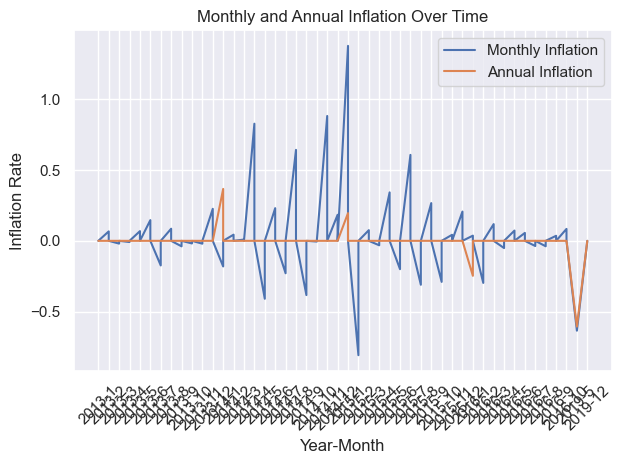

In [15]:
plt.plot(df['SaleYear'].astype(str) + '-' + df['SaleMonth'].astype(str), df['MonthlyInflation'], label='Monthly Inflation')
plt.plot(df['SaleYear'].astype(str) + '-' + df['SaleMonth'].astype(str), df['AnnualInflation'], label='Annual Inflation')

plt.title('Monthly and Annual Inflation Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Inflation Rate')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [16]:
df

,LandUse,SaleDate,SalePrice,SoldAsVacant,Acreage,LandValue,BuildingValue,TotalValue,YearBuilt,Bedrooms,...,CityMonthlyAvgSalePrice,SalePriceDiffFromAnnualAvg,SalePriceDiffFromMonthlyAvg,SalePriceDiffFromCityAnnualAvg,SalePriceDiffFromCityMonthlyAvg,IntrinsicValue,TotalRooms,ValueperRoom,ValuePerAcre,CityAvgAcre
46767,SINGLE FAMILY,2013-01-02,1365000.0,1,1.99,280800.0,1184700.0,1465500.0,2006.0,4.0,...,567561.538462,1.120423e+06,1.146439e+06,1.072250e+06,797438.461538,0.0,8.5,172411.764706,7.364322e+05,1.320098
18829,SINGLE FAMILY,2013-01-02,50000.0,1,0.17,45000.0,48200.0,93200.0,1918.0,3.0,...,232152.929032,-1.945775e+05,-1.685605e+05,-2.117865e+05,-182152.929032,0.0,4.0,23300.000000,5.482353e+05,0.465064
41619,RESIDENTIAL CONDO,2013-01-02,135000.0,1,NaN,NaN,NaN,NaN,NaN,NaN,...,232152.929032,-1.095775e+05,-8.356054e+04,-1.267865e+05,-97152.929032,NaN,NaN,NaN,NaN,0.465064
28455,SINGLE FAMILY,2013-01-02,225000.0,1,0.18,140000.0,83400.0,245200.0,1940.0,2.0,...,232152.929032,-1.957749e+04,6.439458e+03,-3.678650e+04,-7152.929032,21800.0,3.0,81733.333333,1.362222e+06,0.465064
1502,SINGLE FAMILY,2013-01-02,51200.0,1,NaN,NaN,NaN,NaN,NaN,NaN,...,96256.875000,-1.933775e+05,-1.673605e+05,-6.053290e+04,-45056.875000,NaN,NaN,NaN,NaN,0.625309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24579,RESIDENTIAL CONDO,2016-10-31,409900.0,1,NaN,NaN,NaN,NaN,NaN,NaN,...,375432.561614,1.088286e+05,8.491911e+04,6.881945e+04,34467.438386,NaN,NaN,NaN,NaN,0.465064
3081,SINGLE FAMILY,2016-10-31,160000.0,1,NaN,NaN,NaN,NaN,NaN,NaN,...,375432.561614,-1.410714e+05,-1.649809e+05,-1.810805e+05,-215432.561614,NaN,NaN,NaN,NaN,0.465064
51720,SINGLE FAMILY,2016-10-31,245000.0,1,NaN,NaN,NaN,NaN,NaN,NaN,...,375432.561614,-5.607139e+04,-7.998089e+04,-9.608055e+04,-130432.561614,NaN,NaN,NaN,NaN,0.465064
50621,SINGLE FAMILY,2019-05-16,118500.0,1,NaN,NaN,NaN,NaN,NaN,NaN,...,118500.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,NaN,NaN,NaN,NaN,0.430146


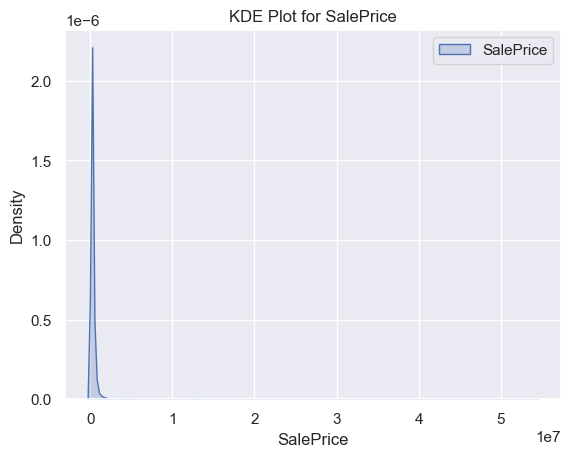

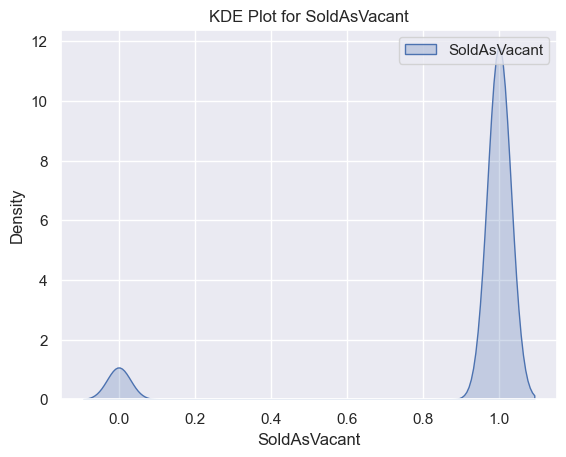

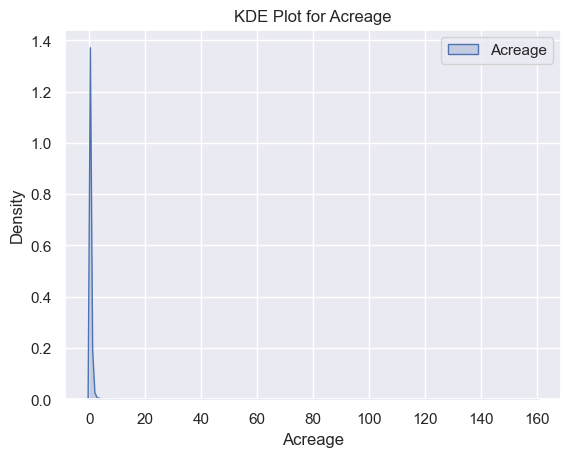

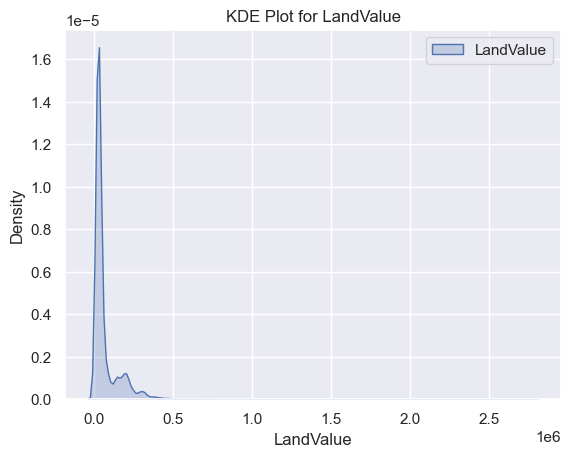

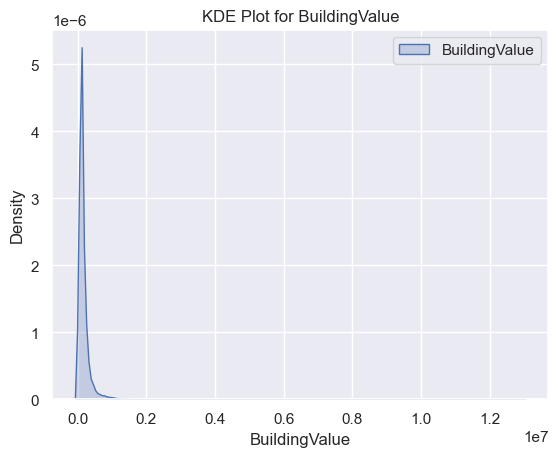

...

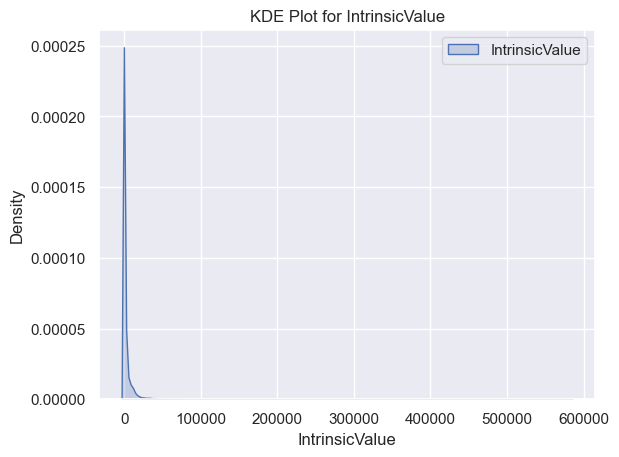

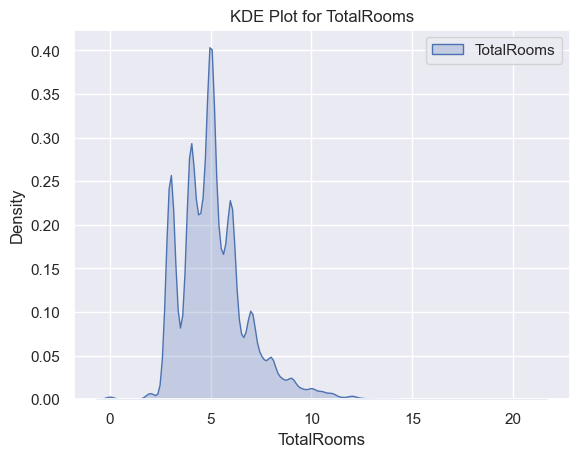

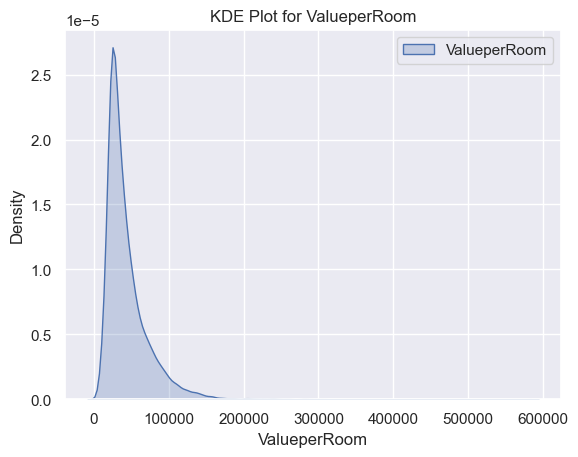

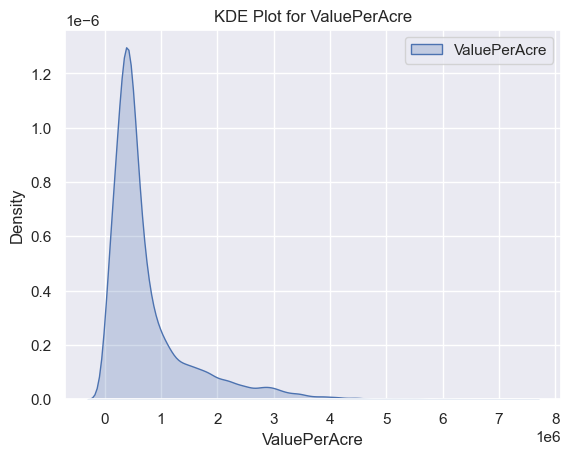

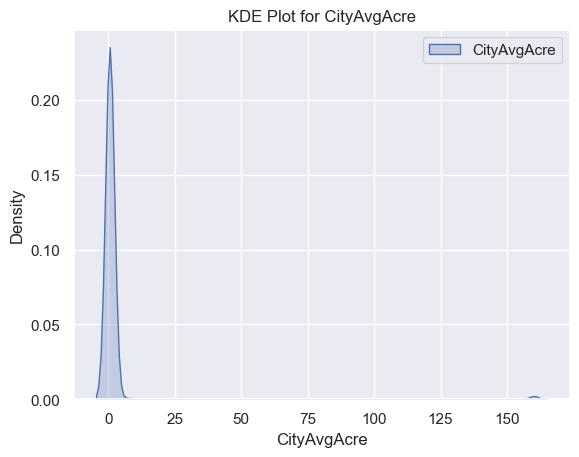

In [19]:
numerical_columns = df.select_dtypes(include=['float64','int32', 'int64']).columns
eda_df = df[numerical_columns].copy()
for column in eda_df.columns:
    sns.kdeplot(eda_df[column], label=column, fill=True)
    plt.title(f'KDE Plot for {column}')
    plt.legend()
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


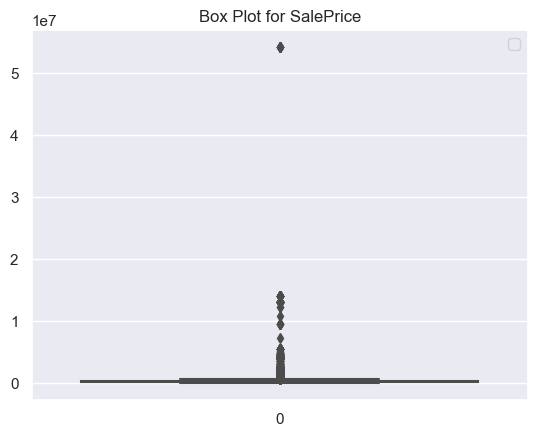

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


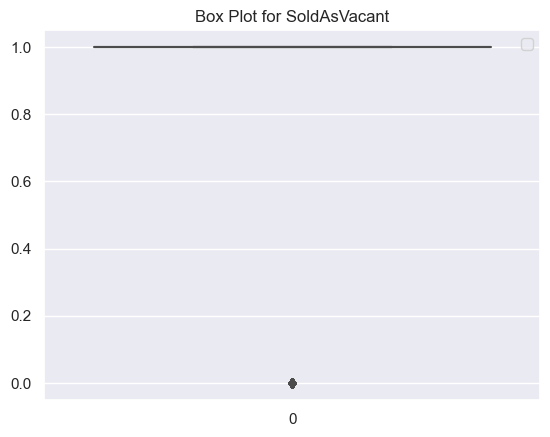

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


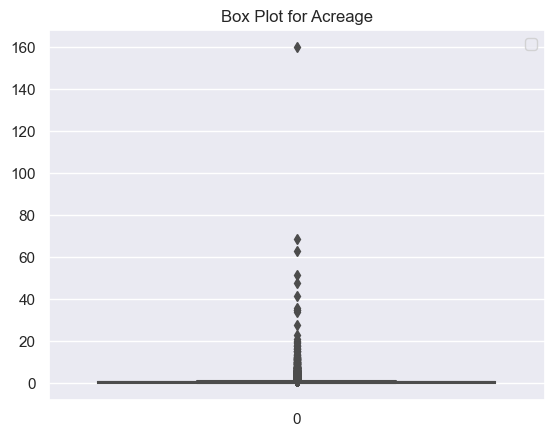

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


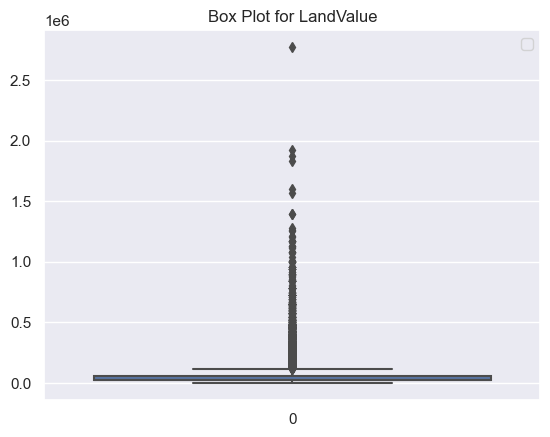

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


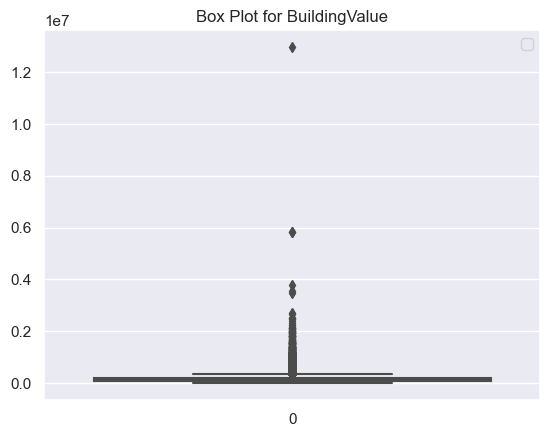

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


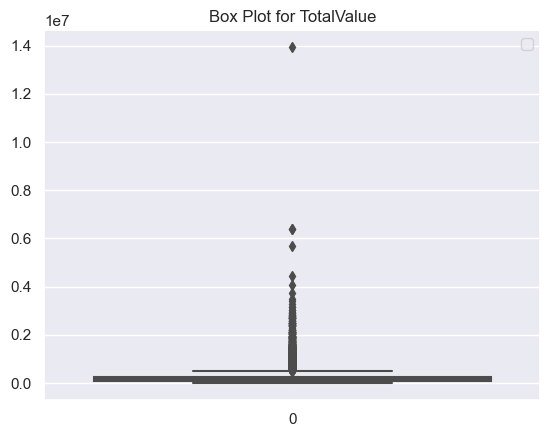

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


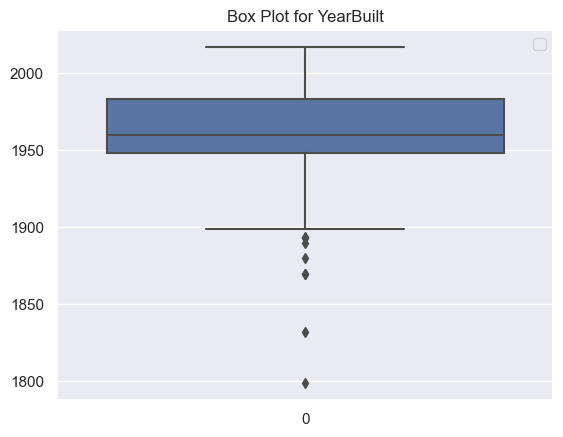

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


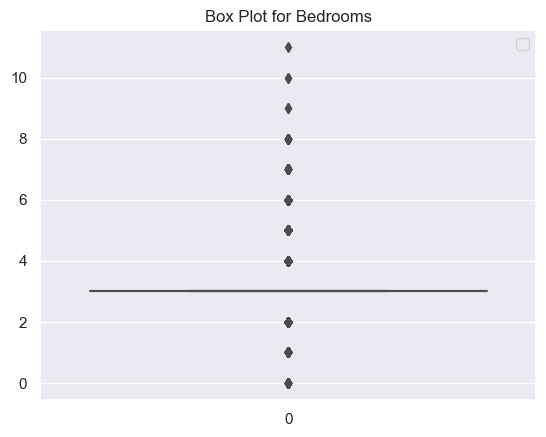

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


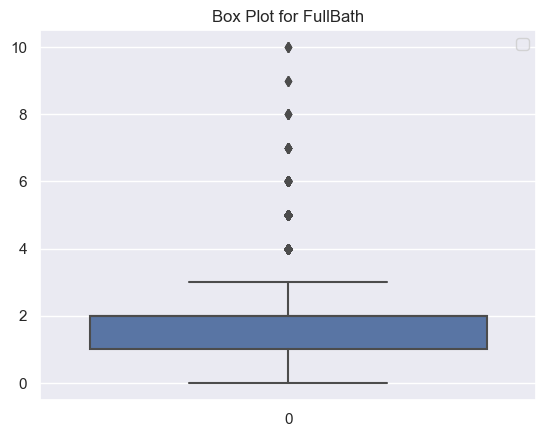

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


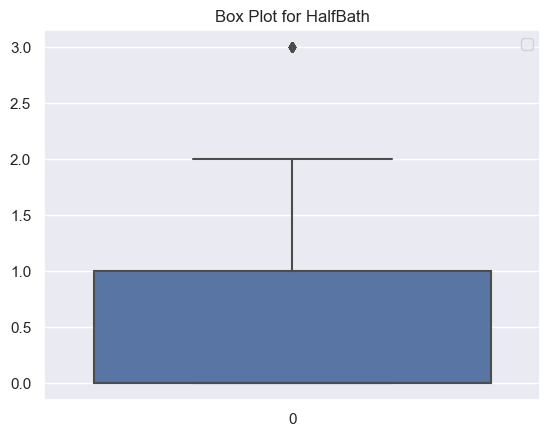

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


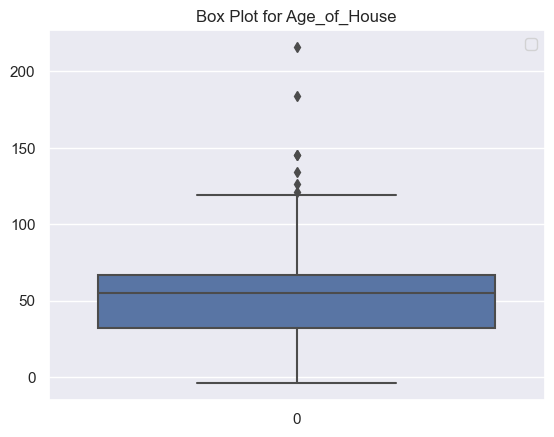

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


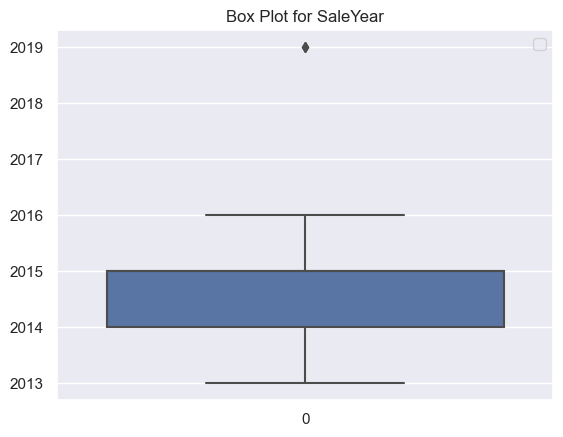

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


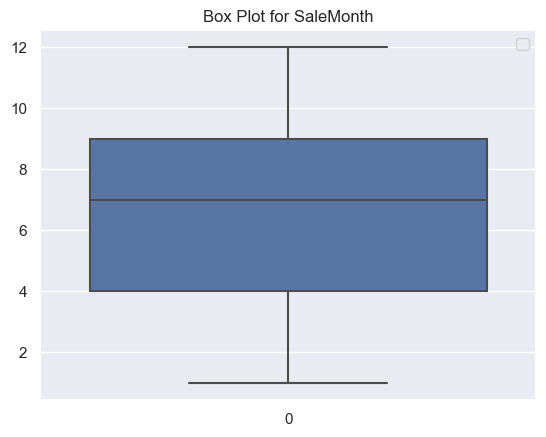

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


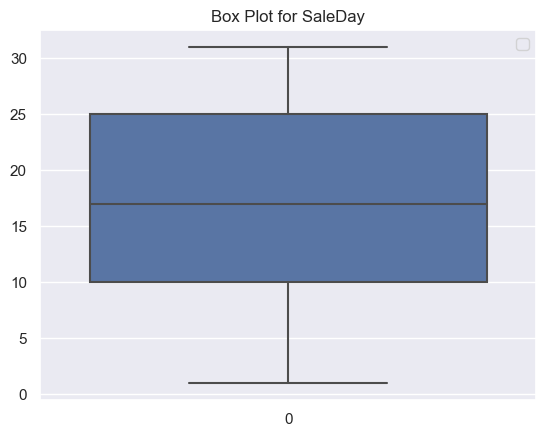

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


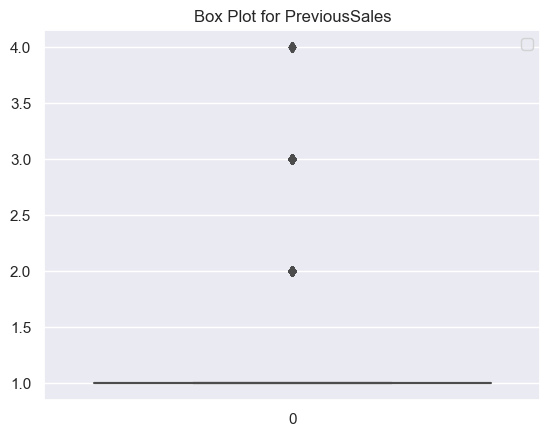

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


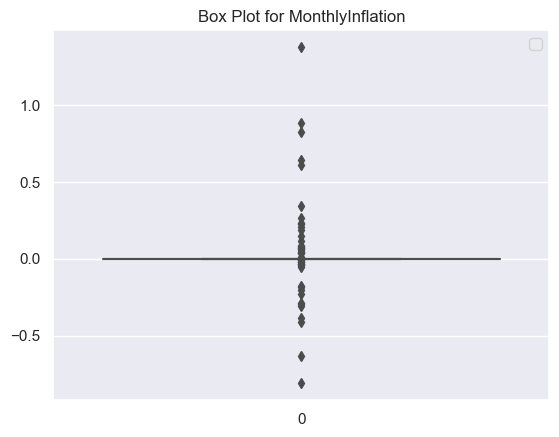

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


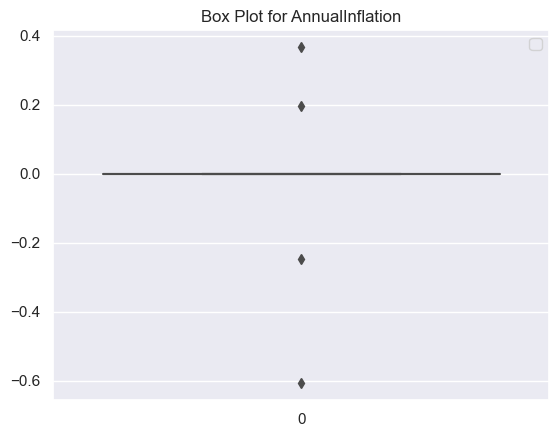

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


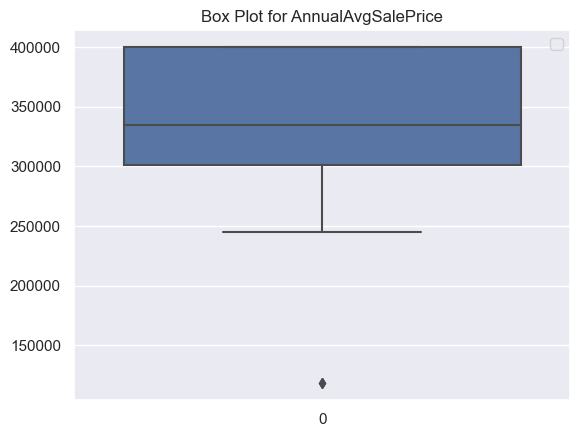

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


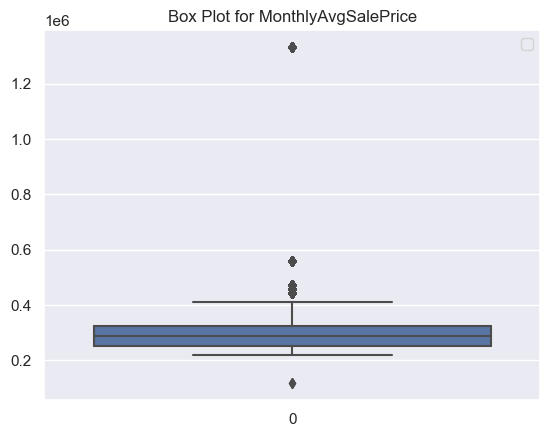

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


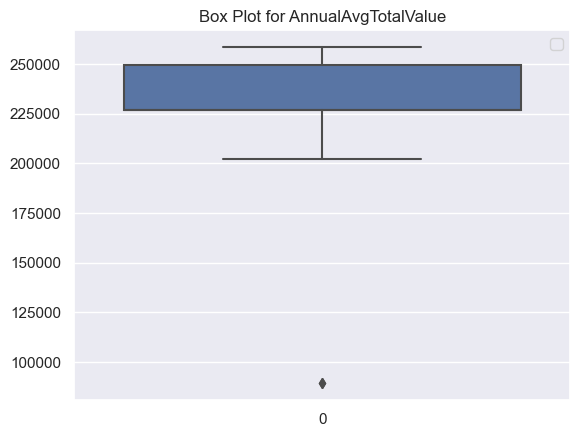

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


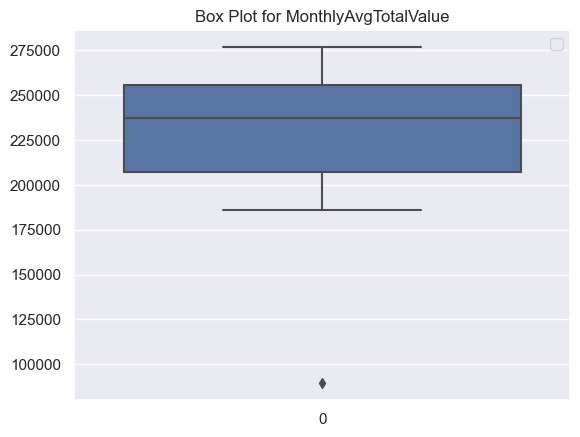

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


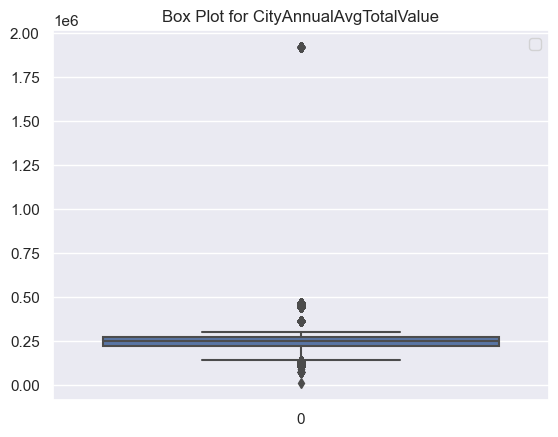

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


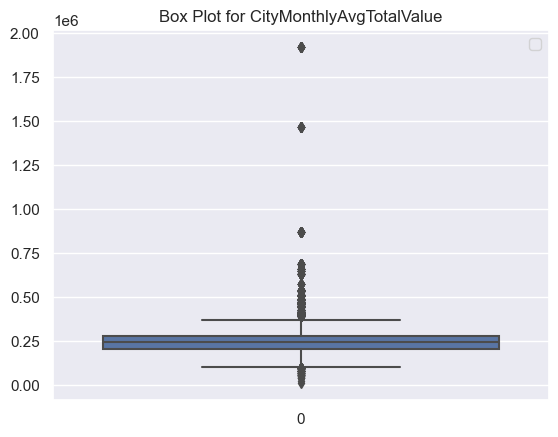

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


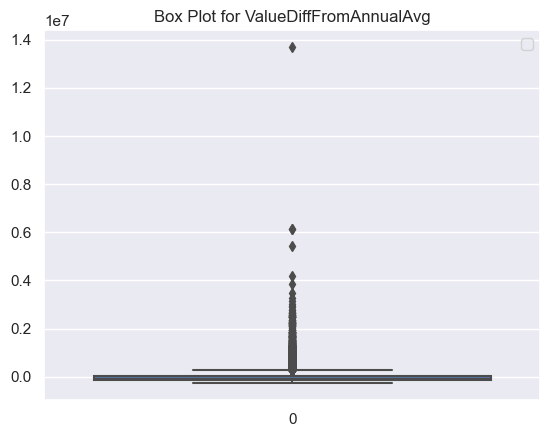

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


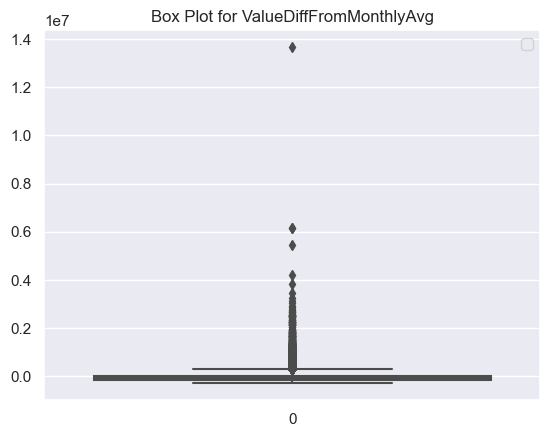

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


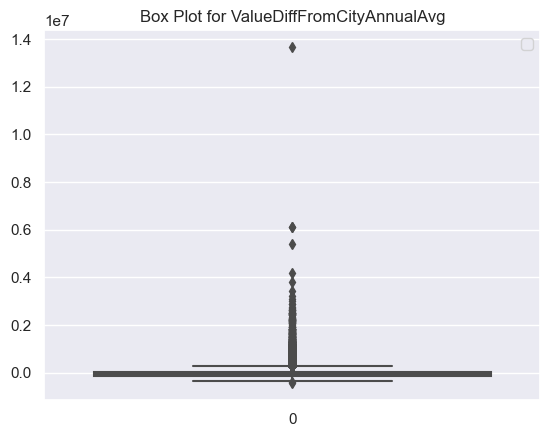

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


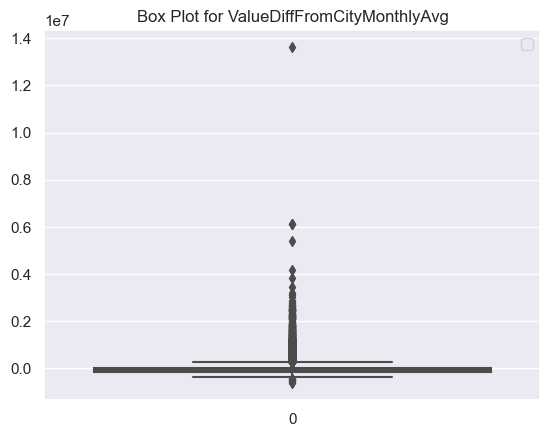

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


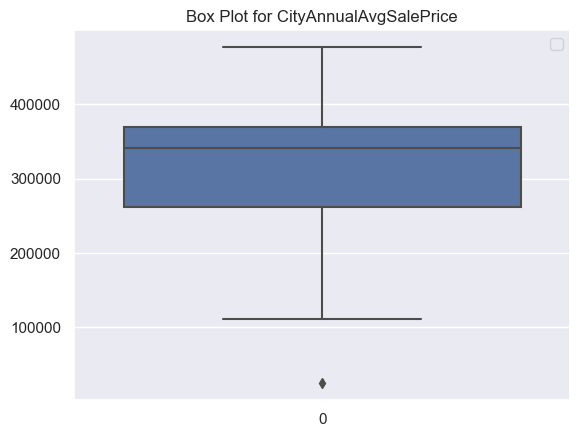

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


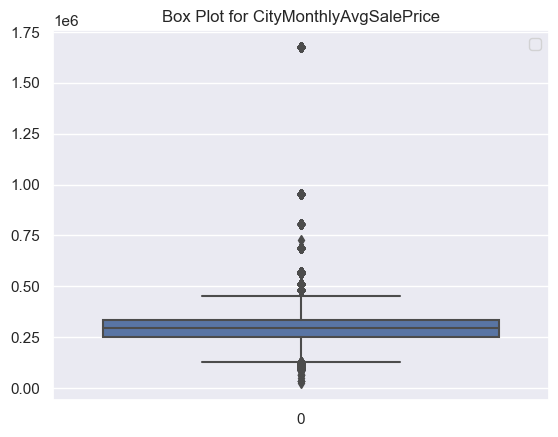

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


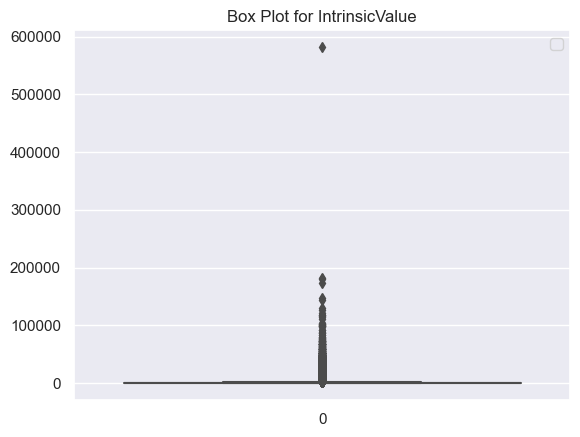

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


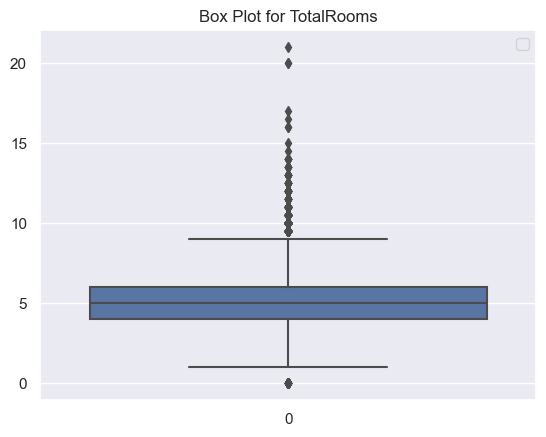

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


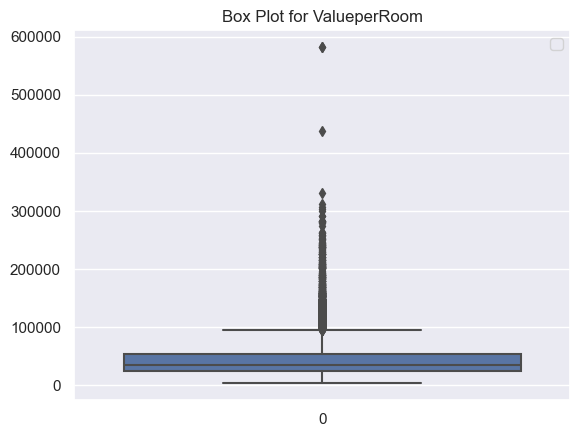

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


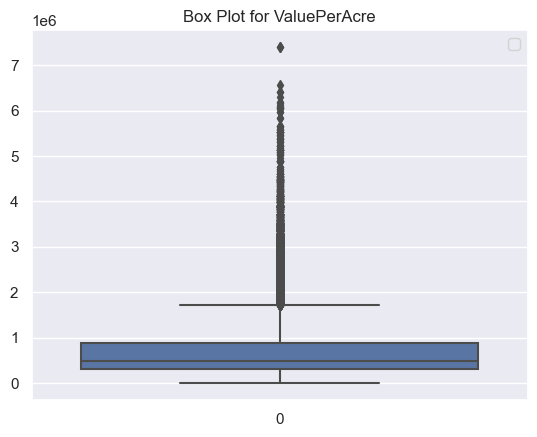

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


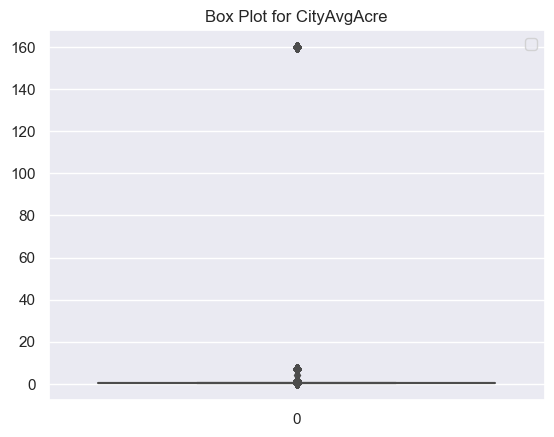

In [20]:
for column in eda_df.columns:
    sns.boxplot(eda_df[column])
    plt.title(f'Box Plot for {column}')
    plt.legend()
    plt.show()

c:\Users\27722\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\Users\27722\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


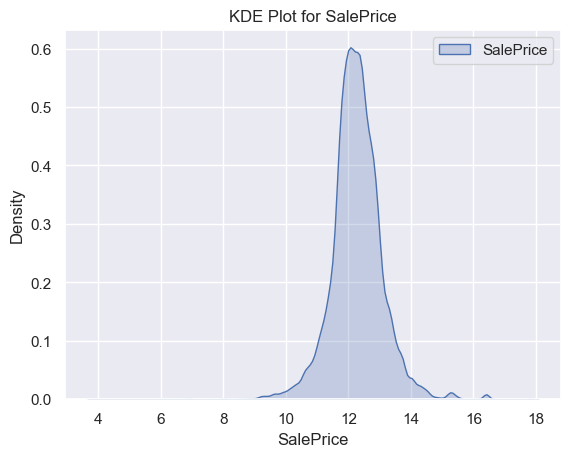

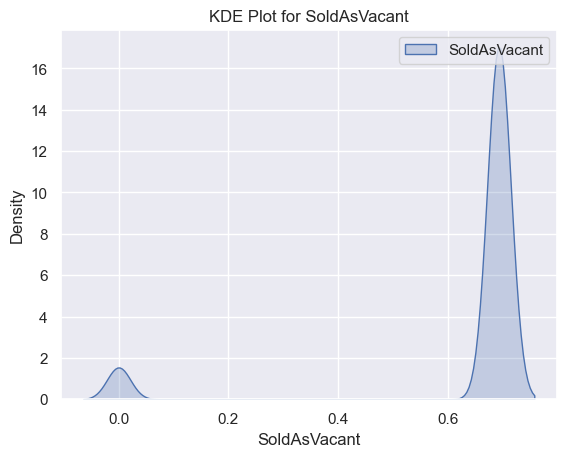

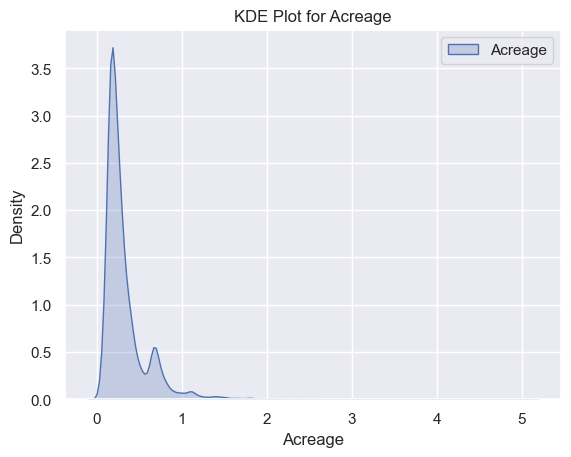

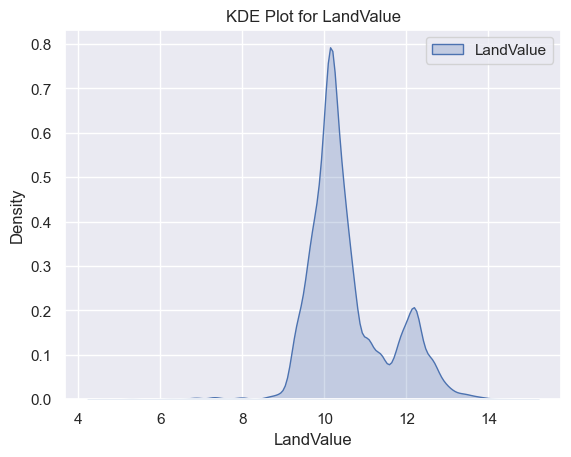

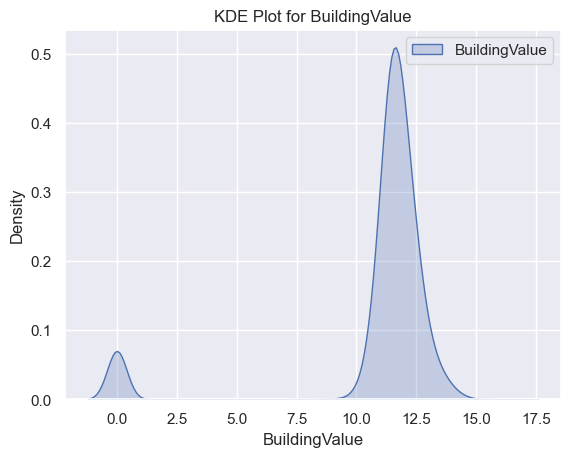

...

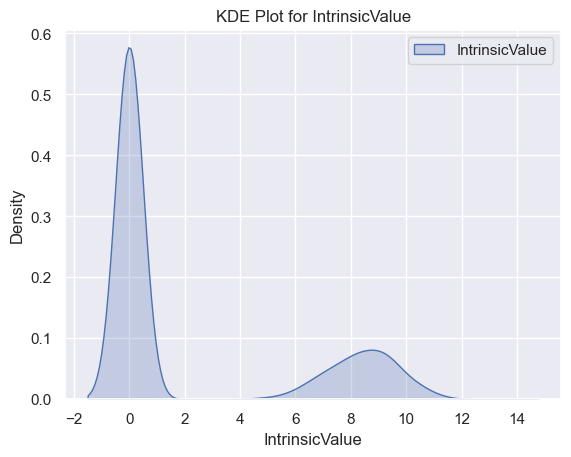

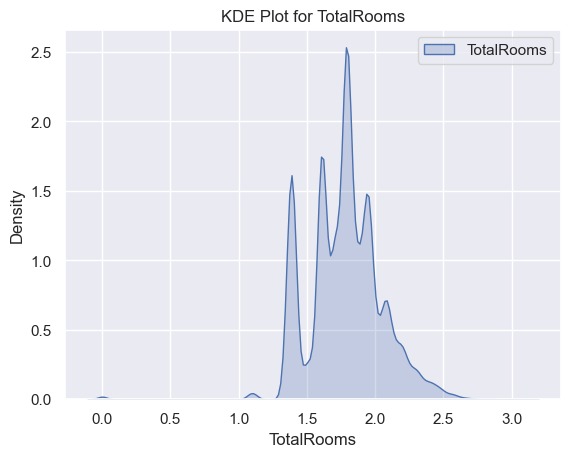

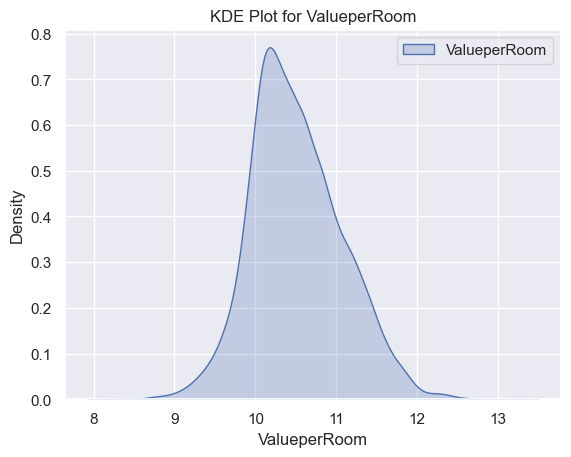

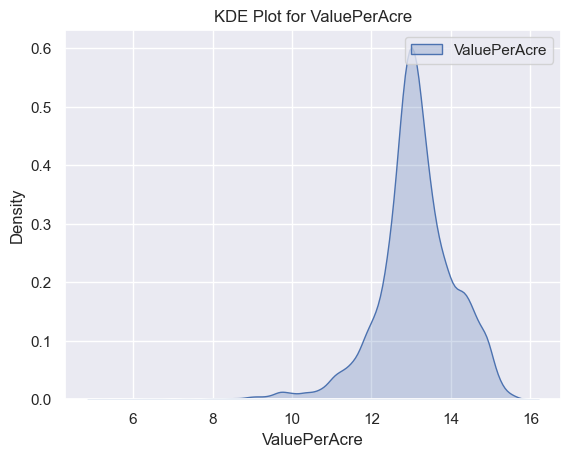

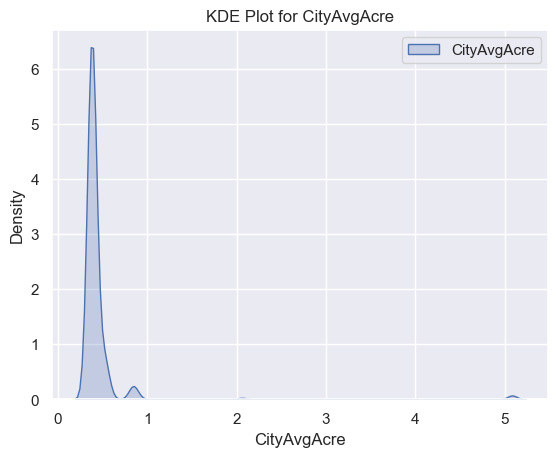

In [21]:
numerical_columns = df.select_dtypes(include=['float64','int32', 'int64']).columns
log_eda_df = np.log(df[numerical_columns].copy()+1)
for column in log_eda_df.columns:
    sns.kdeplot(log_eda_df[column], label=column, fill=True)
    plt.title(f'KDE Plot for {column}')
    plt.legend()
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


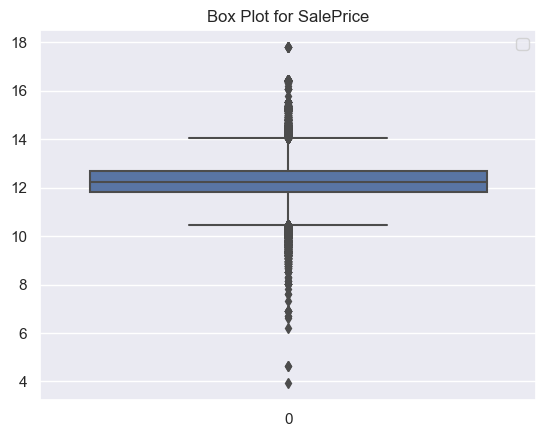

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


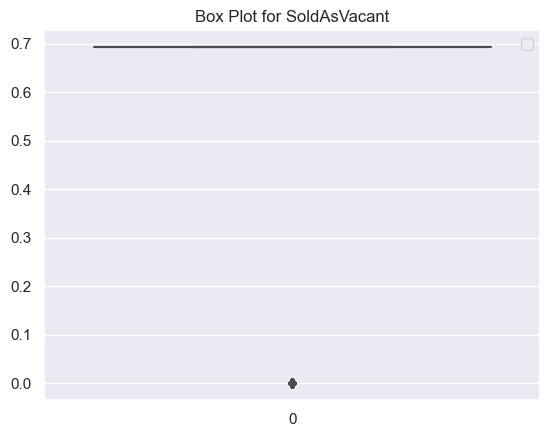

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


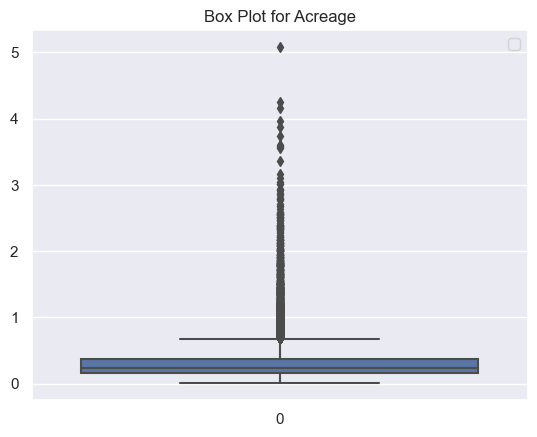

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


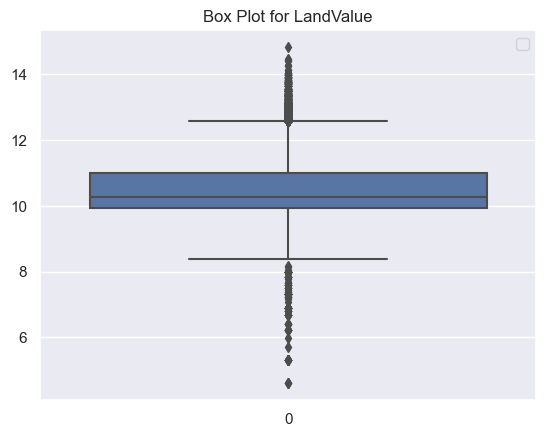

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


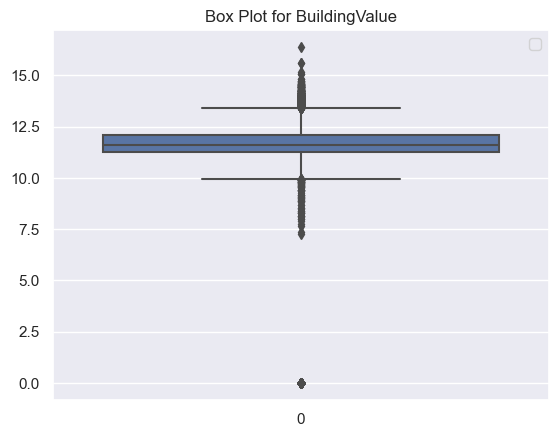

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


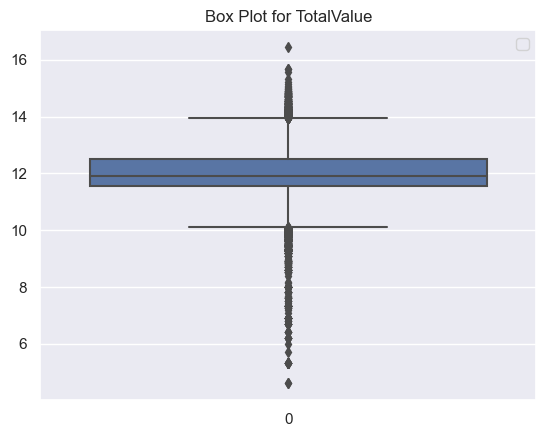

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


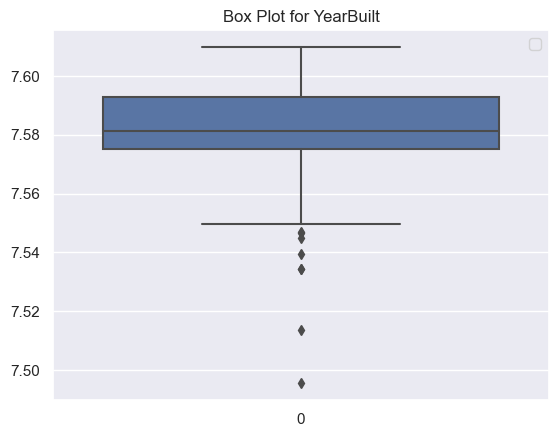

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


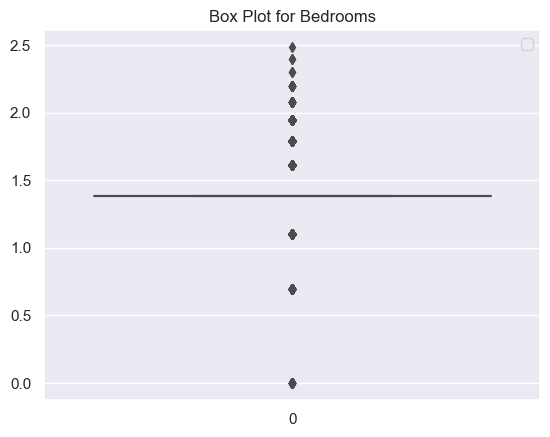

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


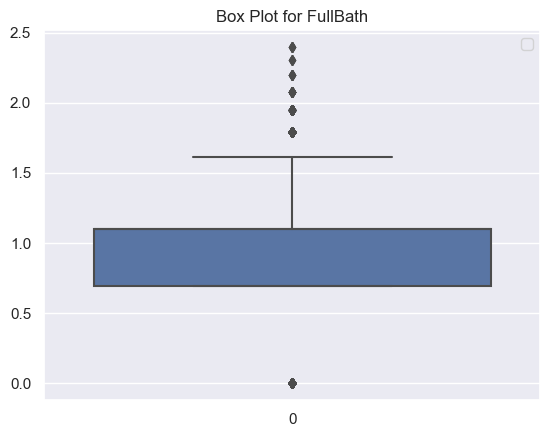

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


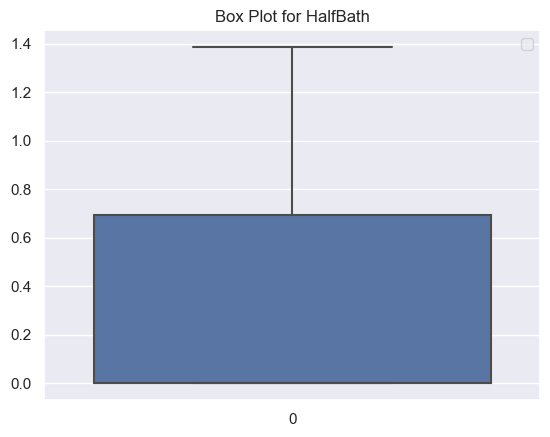

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


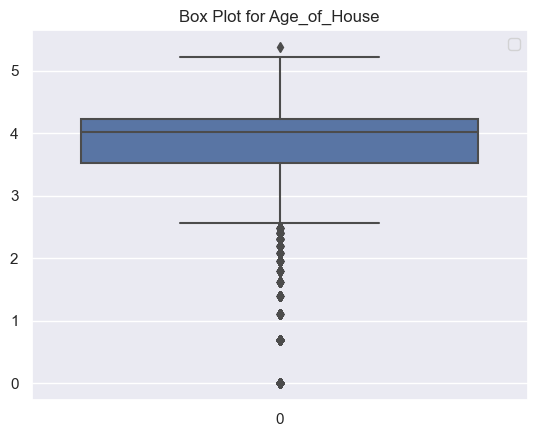

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


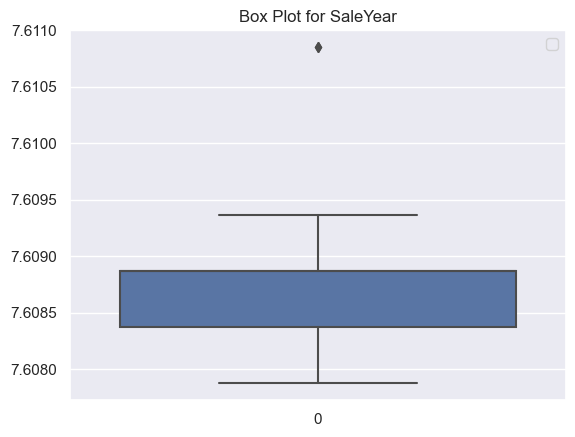

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


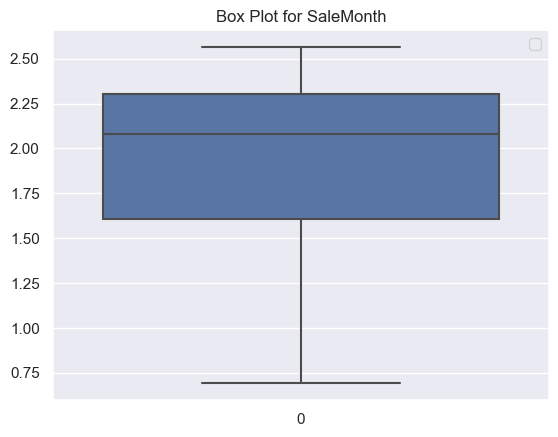

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


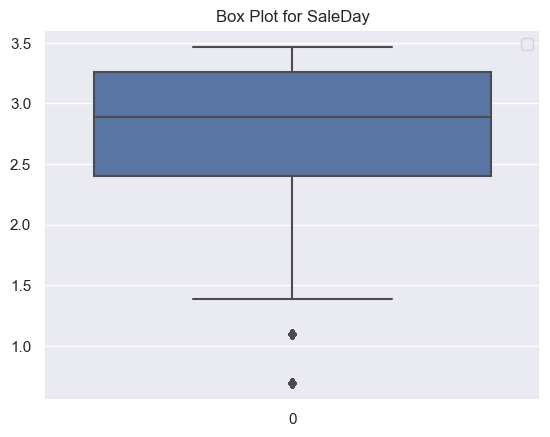

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


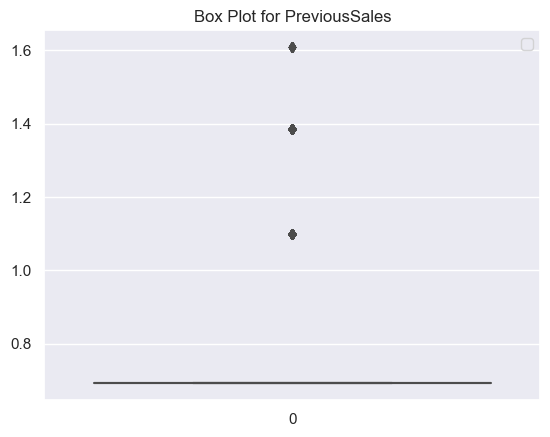

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


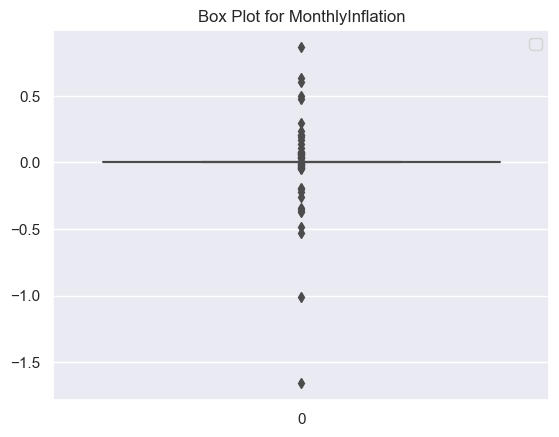

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


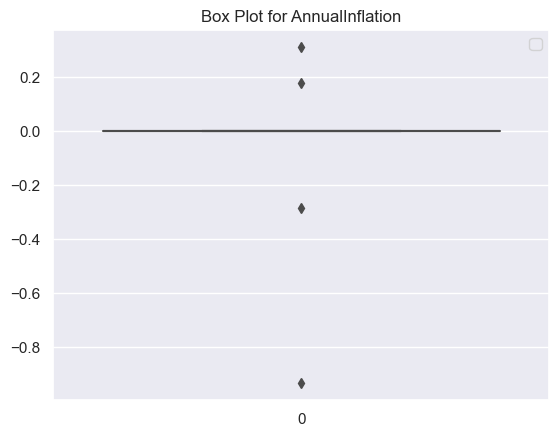

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


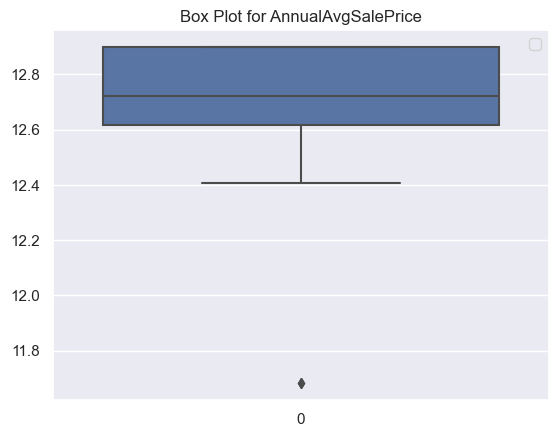

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


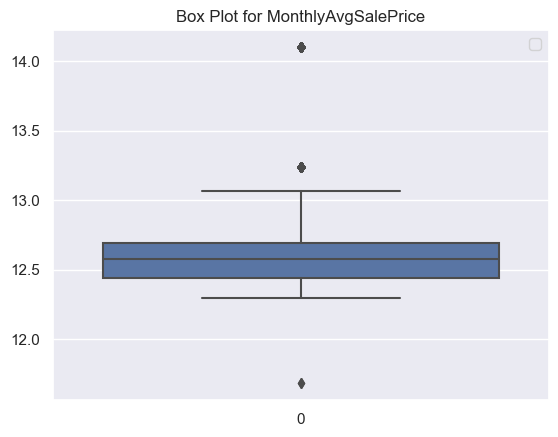

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


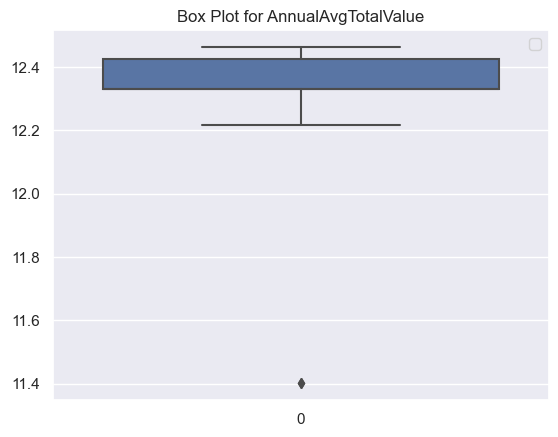

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


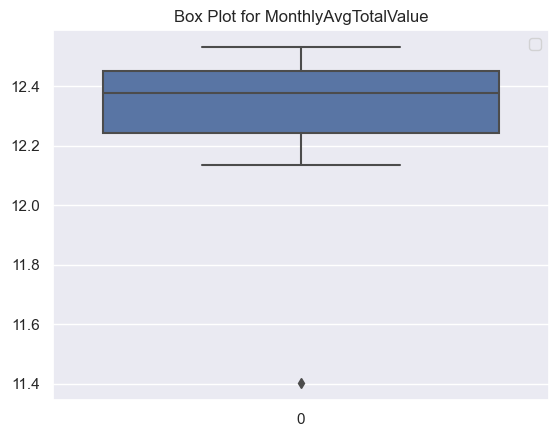

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


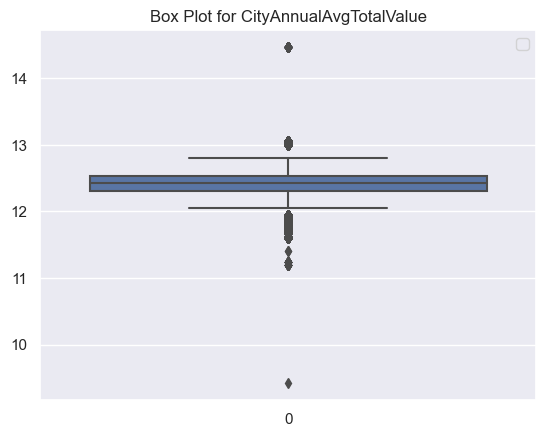

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


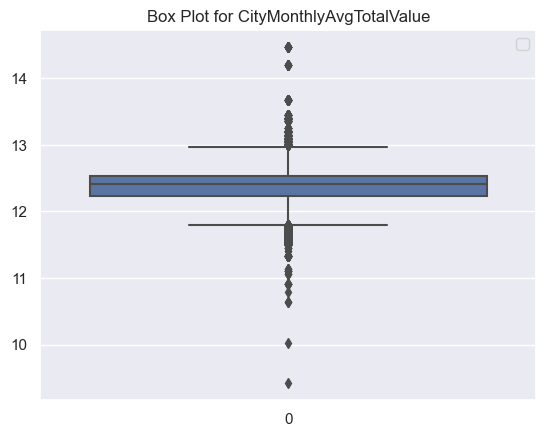

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


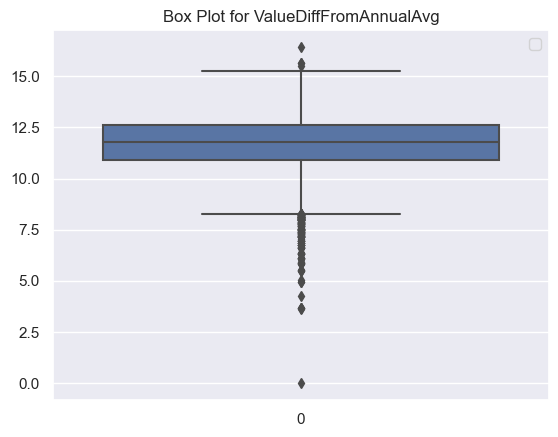

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


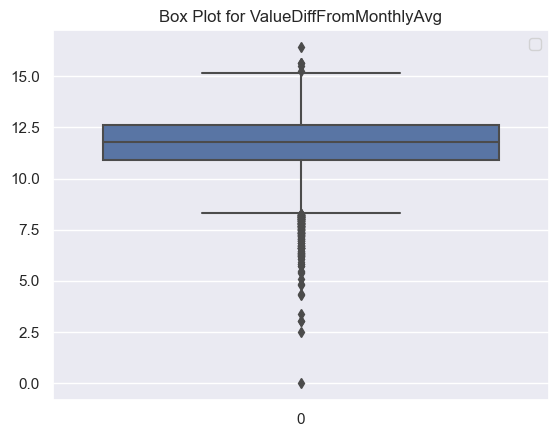

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


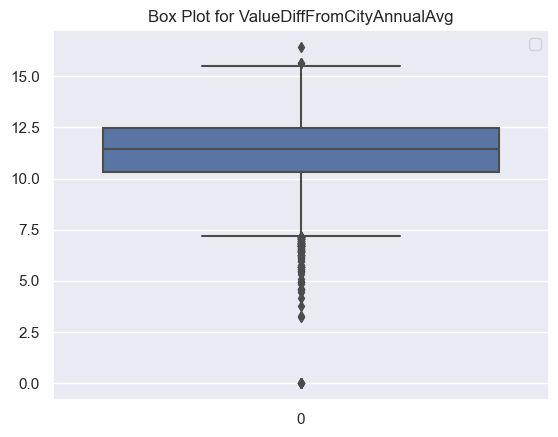

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


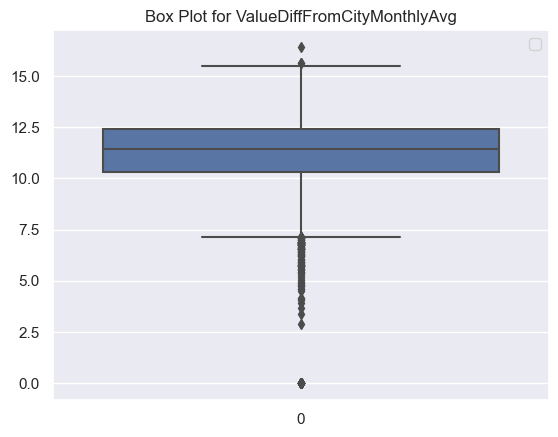

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


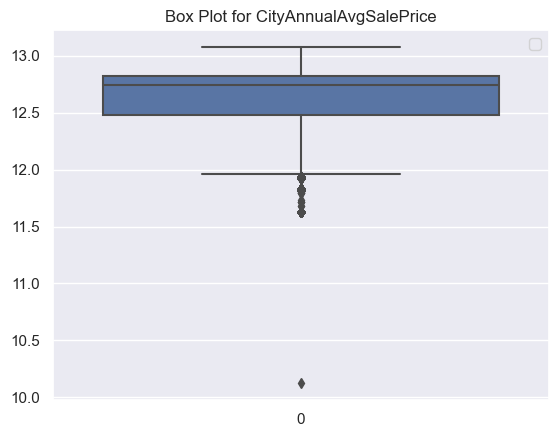

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


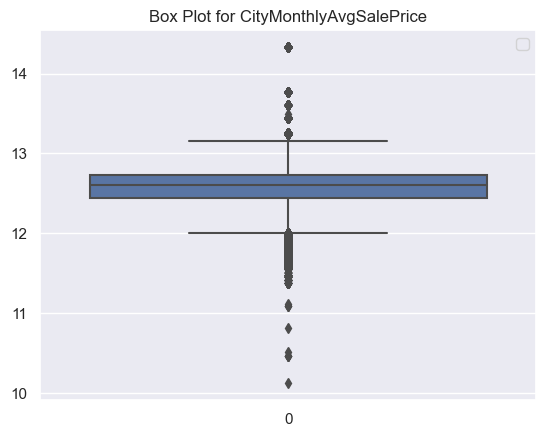

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


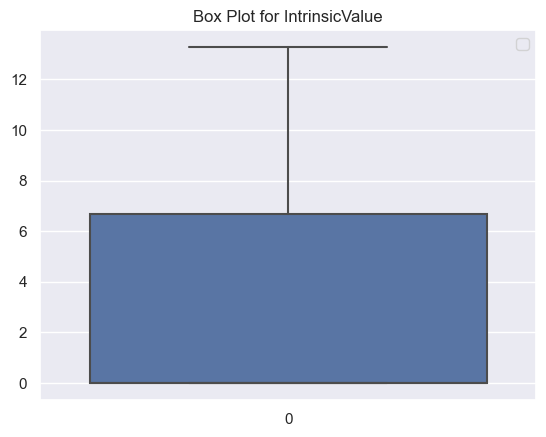

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


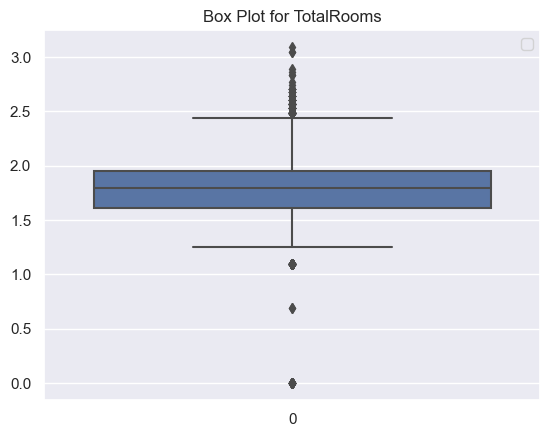

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


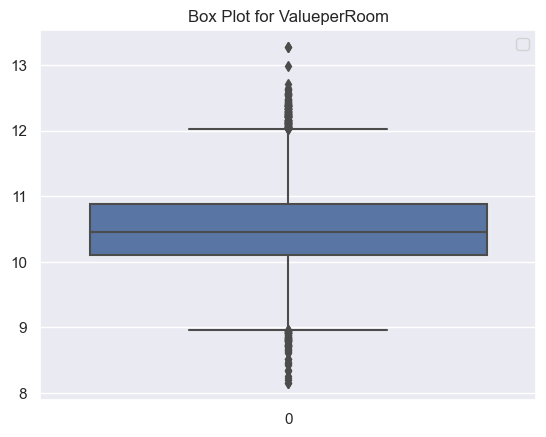

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


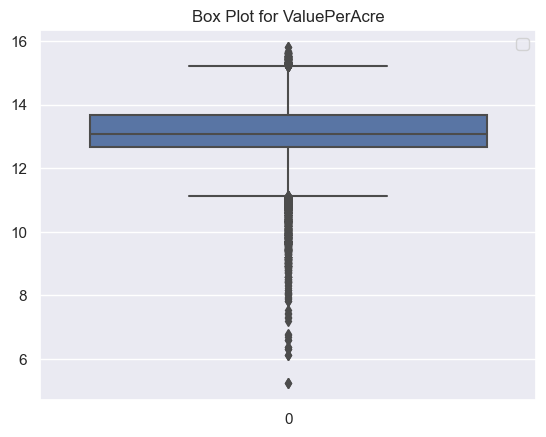

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


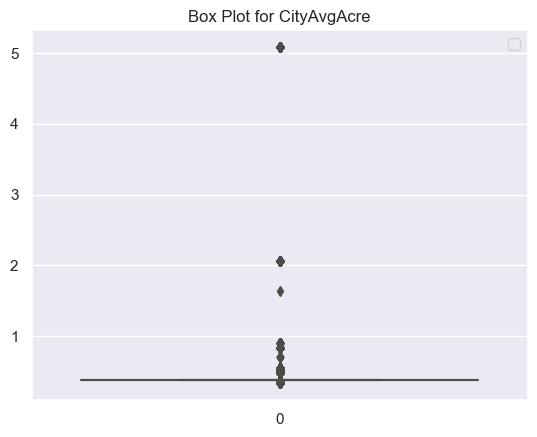

In [22]:
for column in log_eda_df.columns:
    sns.boxplot(log_eda_df[column])
    plt.title(f'Box Plot for {column}')
    plt.legend()
    plt.show()

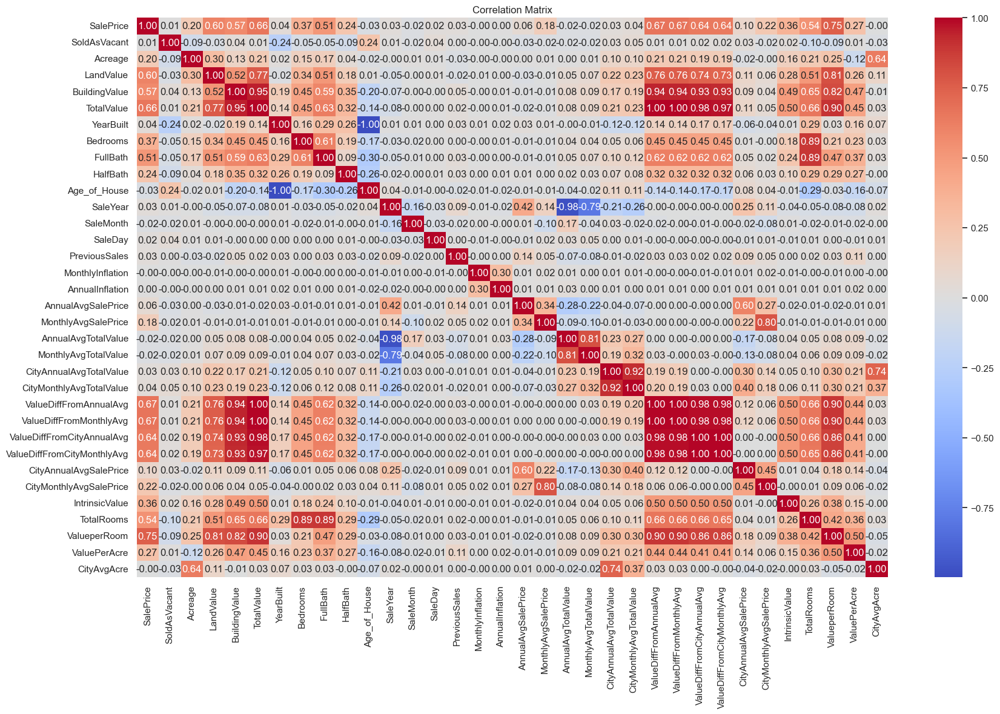

In [23]:
correlation_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(20, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### We have introduced new features that have high correlation with each other and the original features in our dataset
#### As we will be building Nueral Networks we will let the machine decide which will be required and regularize from there

### Our Goal is as such:
- 1. Build Decision tree & XGB regressors that will display feature importance
- 2. Use pipelines to further preprocess our data including imputation
- 3. BUild a basic NN for predicting Sales Price, measure the performance and extract weights to see which features the model found significant
- 4. Build LSTM model and compare it to our basic NN model and chose the best performing to fine tune
- 5. Fine Tune the model using gridsearch and print final results and measuring the moedl's performance on the entire dataset

In [27]:
df['SoldAsVacant'] = df['SoldAsVacant'].astype(bool)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56373 entries, 46767 to 50654
Data columns (total 35 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   LandUse                          56373 non-null  object        
 1   SaleDate                         56373 non-null  datetime64[ns]
 2   SalePrice                        56373 non-null  float64       
 3   SoldAsVacant                     56373 non-null  bool          
 4   Acreage                          25969 non-null  float64       
 5   LandValue                        25969 non-null  float64       
 6   BuildingValue                    25969 non-null  float64       
 7   TotalValue                       25969 non-null  float64       
 8   YearBuilt                        24118 non-null  float64       
 9   Bedrooms                         24112 non-null  float64       
 10  FullBath                         24230 non-null  float

In [24]:
df.to_csv('NashvilleData.csv',index=False)